Gradient Descent: A Deep Dive Beyond Toy Problems
A comprehensive exploration of gradient descent's capabilities and limitations

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D

plt.style.use('seaborn-v0_8-darkgrid')
np.random.seed(42)

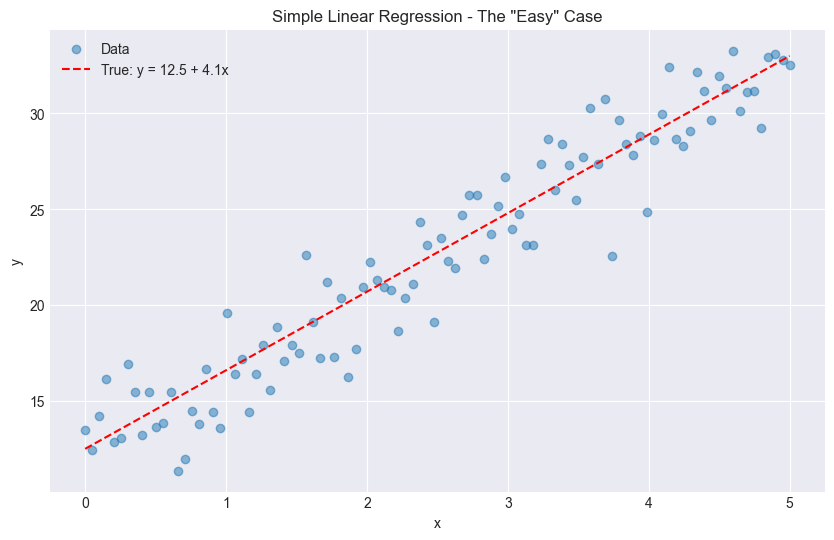

In [2]:
# Generate data
x = np.linspace(0, 5, 100)
y_true = 12.5 + 4.1*x
y_noisy = y_true + np.random.normal(0, 2, size=100)

plt.figure(figsize=(10, 6))
plt.scatter(x, y_noisy, alpha=0.5, label='Data')
plt.plot(x, y_true, 'r--', label='True: y = 12.5 + 4.1x')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.title('Simple Linear Regression - The "Easy" Case')
plt.show()

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3200879563.py:47: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3200879563.py:47: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


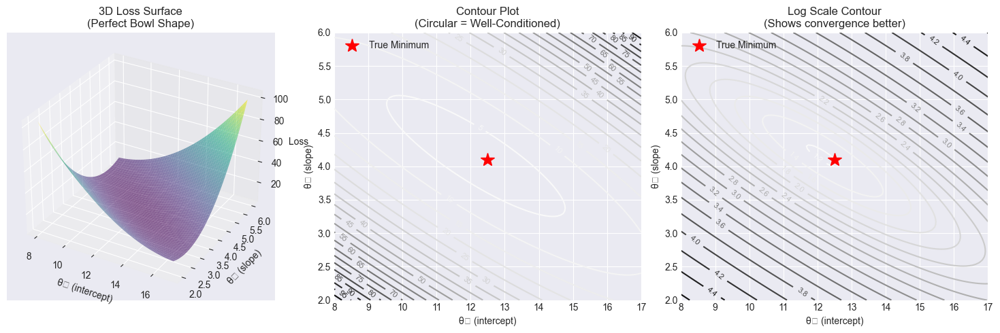

Key observation: Perfect parabola - gradient descent WILL converge from any starting point!


In [3]:
def mse_loss(theta0, theta1, x, y):
    """Compute MSE for given parameters"""
    predictions = theta0 + theta1 * x
    return np.mean((y - predictions)**2)

# Create grid for 3D visualization
theta0_range = np.linspace(8, 17, 100)
theta1_range = np.linspace(2, 6, 100)
T0, T1 = np.meshgrid(theta0_range, theta1_range)

# Compute loss for each point
Z = np.zeros_like(T0)
for i in range(len(theta0_range)):
    for j in range(len(theta1_range)):
        Z[j, i] = mse_loss(T0[j, i], T1[j, i], x, y_noisy)

# 3D Surface Plot
fig = plt.figure(figsize=(15, 5))

ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(T0, T1, Z, cmap='viridis', alpha=0.6)
ax1.set_xlabel('θ₀ (intercept)')
ax1.set_ylabel('θ₁ (slope)')
ax1.set_zlabel('Loss')
ax1.set_title('3D Loss Surface\n(Perfect Bowl Shape)')

# Contour Plot
ax2 = fig.add_subplot(132)
contour = ax2.contour(T0, T1, Z, levels=20)
ax2.clabel(contour, inline=True, fontsize=8)
ax2.set_xlabel('θ₀ (intercept)')
ax2.set_ylabel('θ₁ (slope)')
ax2.set_title('Contour Plot\n(Circular = Well-Conditioned)')
ax2.plot(12.5, 4.1, 'r*', markersize=15, label='True Minimum')
ax2.legend()

# Log scale contour
ax3 = fig.add_subplot(133)
contour = ax3.contour(T0, T1, np.log(Z), levels=20)
ax3.clabel(contour, inline=True, fontsize=8)
ax3.set_xlabel('θ₀ (intercept)')
ax3.set_ylabel('θ₁ (slope)')
ax3.set_title('Log Scale Contour\n(Shows convergence better)')
ax3.plot(12.5, 4.1, 'r*', markersize=15, label='True Minimum')
ax3.legend()

plt.tight_layout()
plt.show()

print("Key observation: Perfect parabola - gradient descent WILL converge from any starting point!")

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\4032684933.py:64: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\4032684933.py:64: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()


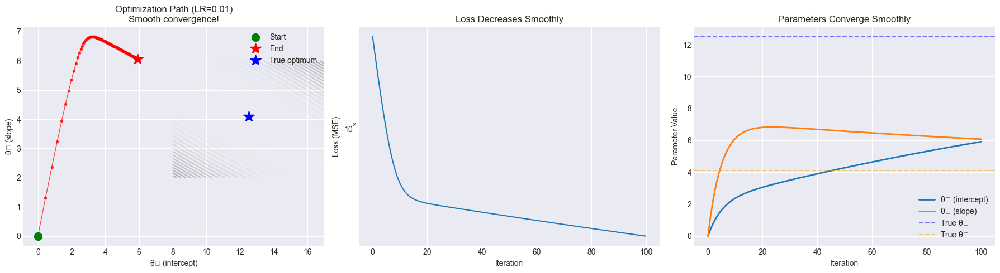

Final parameters: θ₀=5.92, θ₁=6.07
True parameters:  θ₀=12.50, θ₁=4.10
Final loss: 13.16


In [4]:
def gradient_linear(theta0, theta1, x, y):
    """Compute gradient for linear regression"""
    predictions = theta0 + theta1 * x
    errors = predictions - y
    
    grad_theta0 = 2 * np.mean(errors)
    grad_theta1 = 2 * np.mean(errors * x)
    
    return np.array([grad_theta0, grad_theta1])

def run_gradient_descent(x, y, lr, iterations, init_theta=[0, 0]):
    """Run gradient descent and track path"""
    theta = np.array(init_theta, dtype=float)
    history = [theta.copy()]
    losses = [mse_loss(theta[0], theta[1], x, y)]
    
    for i in range(iterations):
        grad = gradient_linear(theta[0], theta[1], x, y)
        theta = theta - lr * grad
        history.append(theta.copy())
        losses.append(mse_loss(theta[0], theta[1], x, y))
    
    return np.array(history), np.array(losses)

# Run with good learning rate
history, losses = run_gradient_descent(x, y_noisy, lr=0.01, iterations=100, init_theta=[0, 0])

# Visualize convergence
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Path on contour
ax = axes[0]
contour = ax.contour(T0, T1, Z, levels=20, alpha=0.3)
ax.plot(history[:, 0], history[:, 1], 'ro-', markersize=3, linewidth=1, alpha=0.7)
ax.plot(history[0, 0], history[0, 1], 'go', markersize=10, label='Start')
ax.plot(history[-1, 0], history[-1, 1], 'r*', markersize=15, label='End')
ax.plot(12.5, 4.1, 'b*', markersize=15, label='True optimum')
ax.set_xlabel('θ₀ (intercept)')
ax.set_ylabel('θ₁ (slope)')
ax.set_title(f'Optimization Path (LR={0.01})\nSmooth convergence!')
ax.legend()

# Loss over iterations
ax = axes[1]
ax.plot(losses)
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss (MSE)')
ax.set_title('Loss Decreases Smoothly')
ax.set_yscale('log')
ax.grid(True)

# Parameter values over iterations
ax = axes[2]
ax.plot(history[:, 0], label='θ₀ (intercept)', linewidth=2)
ax.plot(history[:, 1], label='θ₁ (slope)', linewidth=2)
ax.axhline(12.5, color='b', linestyle='--', alpha=0.5, label='True θ₀')
ax.axhline(4.1, color='orange', linestyle='--', alpha=0.5, label='True θ₁')
ax.set_xlabel('Iteration')
ax.set_ylabel('Parameter Value')
ax.set_title('Parameters Converge Smoothly')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

print(f"Final parameters: θ₀={history[-1,0]:.2f}, θ₁={history[-1,1]:.2f}")
print(f"True parameters:  θ₀=12.50, θ₁=4.10")
print(f"Final loss: {losses[-1]:.2f}")

💡 Key Insight: With a convex problem and good learning rate, gradient descent works perfectly. But this hides all the interesting challenges!

Part 2: Learning Rate Matters - A LOT

c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\numpy\_core\_methods.py:134: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3200879563.py:4: RuntimeWarning: overflow encountered in square
  return np.mean((y - predictions)**2)
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\matplotlib\scale.py:270: RuntimeWarning: overflow encountered in power
  return np.power(self.base, values)
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\1780467600.py:54: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykerne

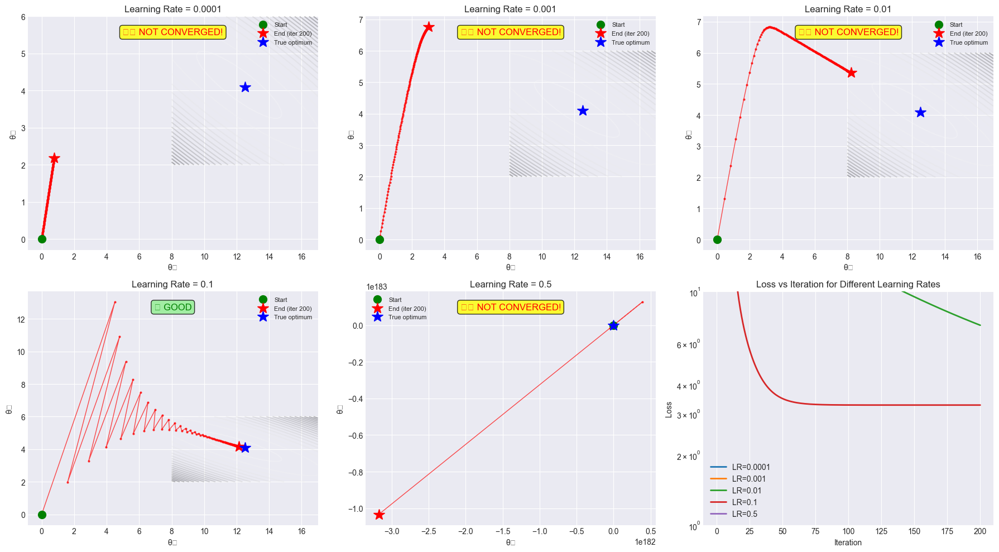

In [5]:
# Try multiple learning rates
learning_rates = [0.0001, 0.001, 0.01, 0.1, 0.5]
iterations = 200

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, lr in enumerate(learning_rates):
    history, losses = run_gradient_descent(x, y_noisy, lr=lr, iterations=iterations)
    
    # Path visualization
    ax = axes[idx]
    contour = ax.contour(T0, T1, Z, levels=20, alpha=0.3)
    ax.plot(history[:, 0], history[:, 1], 'ro-', markersize=2, linewidth=1, alpha=0.7)
    ax.plot(history[0, 0], history[0, 1], 'go', markersize=10, label='Start')
    ax.plot(history[-1, 0], history[-1, 1], 'r*', markersize=15, label=f'End (iter {iterations})')
    ax.plot(12.5, 4.1, 'b*', markersize=15, label='True optimum')
    ax.set_xlabel('θ₀')
    ax.set_ylabel('θ₁')
    ax.set_title(f'Learning Rate = {lr}')
    ax.legend(fontsize=8)
    
    # Annotate behavior
    final_dist = np.linalg.norm(history[-1] - np.array([12.5, 4.1]))
    if final_dist > 1.0:
        ax.text(0.5, 0.95, '⚠️ NOT CONVERGED!', transform=ax.transAxes,
                ha='center', va='top', fontsize=12, color='red',
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.8))
    elif lr < 0.001:
        ax.text(0.5, 0.95, '🐌 TOO SLOW', transform=ax.transAxes,
                ha='center', va='top', fontsize=12, color='orange',
                bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))
    elif lr > 0.1:
        ax.text(0.5, 0.95, '⚡ OSCILLATING', transform=ax.transAxes,
                ha='center', va='top', fontsize=12, color='red',
                bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.8))
    else:
        ax.text(0.5, 0.95, '✓ GOOD', transform=ax.transAxes,
                ha='center', va='top', fontsize=12, color='green',
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))

# Loss comparison
ax = axes[-1]
for lr in learning_rates:
    history, losses = run_gradient_descent(x, y_noisy, lr=lr, iterations=iterations)
    ax.plot(losses, label=f'LR={lr}', linewidth=2)
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.set_title('Loss vs Iteration for Different Learning Rates')
ax.set_yscale('log')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\69701940.py:28: UserWarning: Glyph 128165 (\N{COLLISION SYMBOL}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128165 (\N{COLLISION SYMBOL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


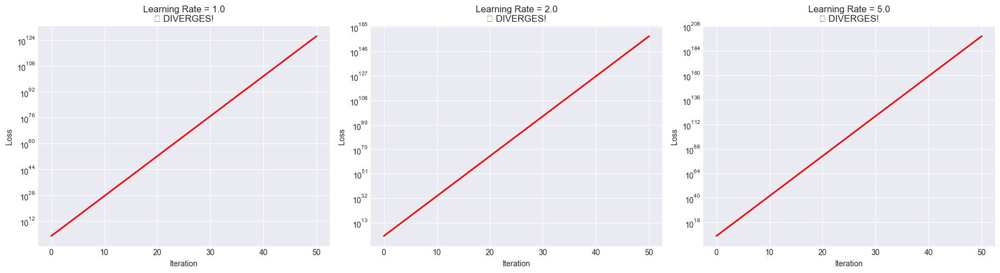

💡 Key Lesson: Learning rate selection is CRITICAL
   Too small → slow convergence
   Too large → oscillation or divergence
   Just right → smooth convergence


In [6]:
# Demonstrate divergence
bad_lrs = [1.0, 2.0, 5.0]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for idx, lr in enumerate(bad_lrs):
    try:
        history, losses = run_gradient_descent(x, y_noisy, lr=lr, iterations=50)
        
        ax = axes[idx]
        ax.plot(losses, 'r-', linewidth=2)
        ax.set_xlabel('Iteration')
        ax.set_ylabel('Loss')
        ax.set_title(f'Learning Rate = {lr}\n💥 DIVERGES!')
        ax.set_yscale('log')
        ax.grid(True)
        
        if np.any(np.isnan(losses)) or np.any(np.isinf(losses)):
            ax.text(0.5, 0.5, '💥 EXPLODED TO ∞', transform=ax.transAxes,
                    ha='center', va='center', fontsize=16, color='red',
                    bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.9))
    except:
        ax = axes[idx]
        ax.text(0.5, 0.5, f'LR={lr}\n💥 NUMERICAL OVERFLOW', transform=ax.transAxes,
                ha='center', va='center', fontsize=14, color='red')
        ax.set_title('DIVERGED')

plt.tight_layout()
plt.show()

print("💡 Key Lesson: Learning rate selection is CRITICAL")
print("   Too small → slow convergence")
print("   Too large → oscillation or divergence")
print("   Just right → smooth convergence")

Part 3: Non-Convex Problems (Where Things Get Real)
3.1 The Rastrigin Function (Multiple Local Minima)

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3132155718.py:58: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3132155718.py:58: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3132155718.py:58: UserWarning: Glyph 128064 (\N{EYES}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128064 (\N{EYES}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


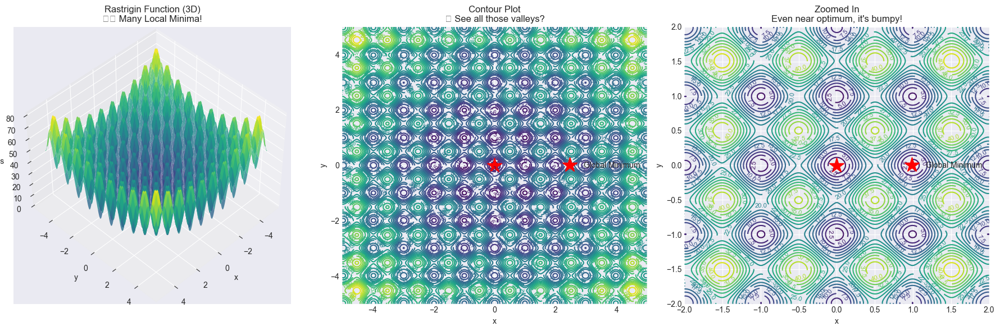

In [7]:
def rastrigin(x, y):
    """
    Rastrigin function: MANY local minima
    Global minimum at (0, 0) with value 0
    """
    A = 10
    return A * 2 + (x**2 - A * np.cos(2 * np.pi * x)) + (y**2 - A * np.cos(2 * np.pi * y))

def rastrigin_gradient(x, y):
    """Gradient of Rastrigin function"""
    A = 10
    grad_x = 2*x + 2*A*np.pi*np.sin(2*np.pi*x)
    grad_y = 2*y + 2*A*np.pi*np.sin(2*np.pi*y)
    return np.array([grad_x, grad_y])

# Visualize the landscape
x_range = np.linspace(-5, 5, 400)
y_range = np.linspace(-5, 5, 400)
X, Y = np.meshgrid(x_range, y_range)
Z_rast = rastrigin(X, Y)

fig = plt.figure(figsize=(18, 6))

# 3D plot
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(X, Y, Z_rast, cmap='viridis', alpha=0.8, edgecolor='none')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('Loss')
ax1.set_title('Rastrigin Function (3D)\n⚠️ Many Local Minima!')
ax1.view_init(elev=45, azim=45)

# Contour plot
ax2 = fig.add_subplot(132)
contour = ax2.contour(X, Y, Z_rast, levels=30, cmap='viridis')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.plot(0, 0, 'r*', markersize=20, label='Global Minimum')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_title('Contour Plot\n👀 See all those valleys?')
ax2.legend()

# Zoomed in around global minimum
ax3 = fig.add_subplot(133)
zoom_range = 2
x_zoom = np.linspace(-zoom_range, zoom_range, 200)
y_zoom = np.linspace(-zoom_range, zoom_range, 200)
X_zoom, Y_zoom = np.meshgrid(x_zoom, y_zoom)
Z_zoom = rastrigin(X_zoom, Y_zoom)
contour = ax3.contour(X_zoom, Y_zoom, Z_zoom, levels=20, cmap='viridis')
ax3.clabel(contour, inline=True, fontsize=8)
ax3.plot(0, 0, 'r*', markersize=20, label='Global Minimum')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.set_title('Zoomed In\nEven near optimum, it\'s bumpy!')
ax3.legend()

plt.tight_layout()
plt.show()

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3945576007.py:66: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


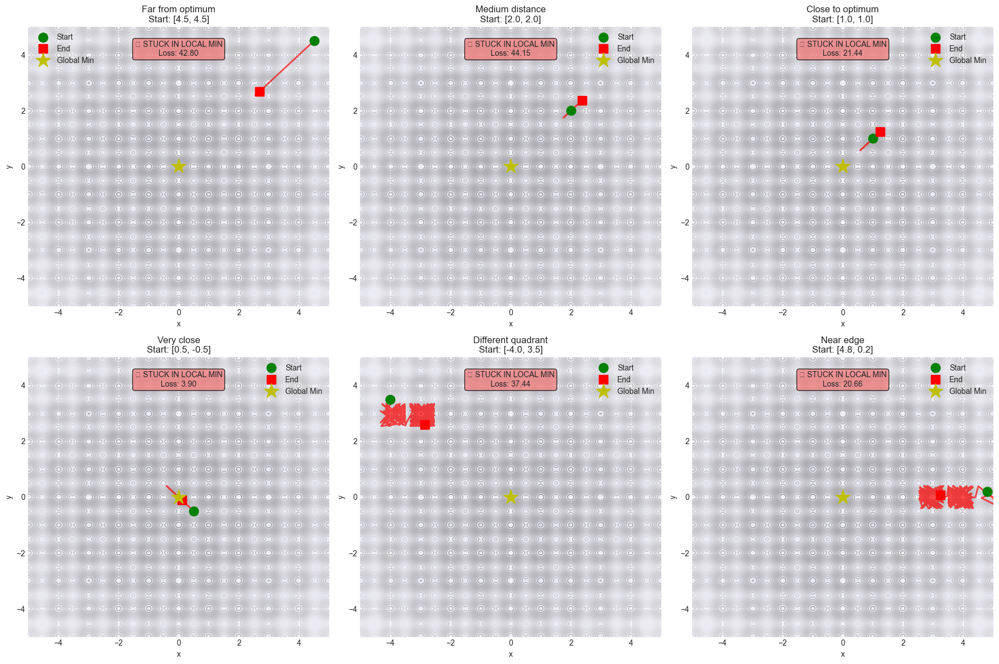

💡 KEY LESSON: On non-convex problems, WHERE YOU START matters!
   Same algorithm, same learning rate, different results!


In [8]:
def run_gd_rastrigin(init_point, lr, iterations):
    """Run gradient descent on Rastrigin function"""
    point = np.array(init_point, dtype=float)
    history = [point.copy()]
    losses = [rastrigin(point[0], point[1])]
    
    for i in range(iterations):
        grad = rastrigin_gradient(point[0], point[1])
        point = point - lr * grad
        history.append(point.copy())
        losses.append(rastrigin(point[0], point[1]))
    
    return np.array(history), np.array(losses)

# Try different starting points
starting_points = [
    ([4.5, 4.5], 'Far from optimum'),
    ([2.0, 2.0], 'Medium distance'),
    ([1.0, 1.0], 'Close to optimum'),
    ([0.5, -0.5], 'Very close'),
    ([-4.0, 3.5], 'Different quadrant'),
    ([4.8, 0.2], 'Near edge')
]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

lr = 0.01
iterations = 200

for idx, (start, description) in enumerate(starting_points):
    history, losses = run_gd_rastrigin(start, lr, iterations)
    
    ax = axes[idx]
    # Plot landscape
    contour = ax.contour(X, Y, Z_rast, levels=30, alpha=0.3, cmap='gray')
    
    # Plot path
    ax.plot(history[:, 0], history[:, 1], 'r-', linewidth=2, alpha=0.7)
    ax.plot(history[0, 0], history[0, 1], 'go', markersize=12, label='Start', zorder=5)
    ax.plot(history[-1, 0], history[-1, 1], 'rs', markersize=12, label='End', zorder=5)
    ax.plot(0, 0, 'y*', markersize=20, label='Global Min', zorder=5)
    
    ax.set_xlim(-5, 5)
    ax.set_ylim(-5, 5)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'{description}\nStart: {start}')
    ax.legend()
    
    # Check if found global minimum
    final_dist = np.linalg.norm(history[-1])
    final_loss = losses[-1]
    
    if final_loss < 1.0:  # Close to global minimum
        result = f'✓ FOUND GLOBAL MIN!\nLoss: {final_loss:.2f}'
        color = 'lightgreen'
    else:
        result = f'✗ STUCK IN LOCAL MIN\nLoss: {final_loss:.2f}'
        color = 'lightcoral'
    
    ax.text(0.5, 0.95, result, transform=ax.transAxes,
            ha='center', va='top', fontsize=10,
            bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))

plt.tight_layout()
plt.show()

print("💡 KEY LESSON: On non-convex problems, WHERE YOU START matters!")
print("   Same algorithm, same learning rate, different results!")

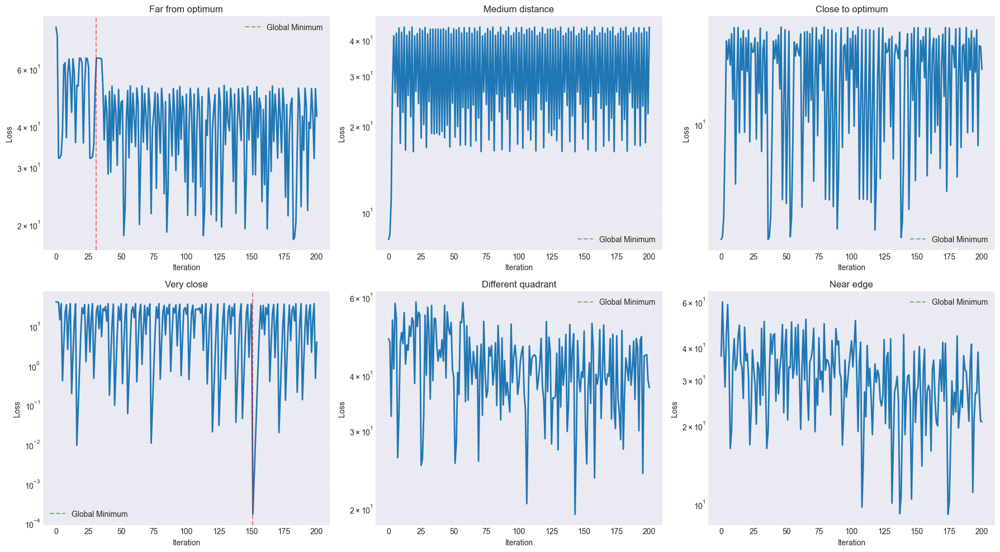

In [9]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, (start, description) in enumerate(starting_points):
    history, losses = run_gd_rastrigin(start, lr, iterations)
    
    ax = axes[idx]
    ax.plot(losses, linewidth=2)
    ax.set_xlabel('Iteration')
    ax.set_ylabel('Loss')
    ax.set_title(f'{description}')
    ax.set_yscale('log')
    ax.axhline(y=0, color='g', linestyle='--', label='Global Minimum', alpha=0.5)
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # Mark where it gets stuck
    if losses[-1] > 1.0:
        stuck_iteration = np.where(np.abs(np.diff(losses)) < 0.01)[0]
        if len(stuck_iteration) > 0:
            ax.axvline(x=stuck_iteration[0], color='r', linestyle='--', 
                      alpha=0.5, label='Got stuck here')

plt.tight_layout()
plt.show()

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3066237304.py:52: UserWarning: Glyph 127820 (\N{BANANA}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3066237304.py:52: UserWarning: Glyph 128064 (\N{EYES}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127820 (\N{BANANA}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


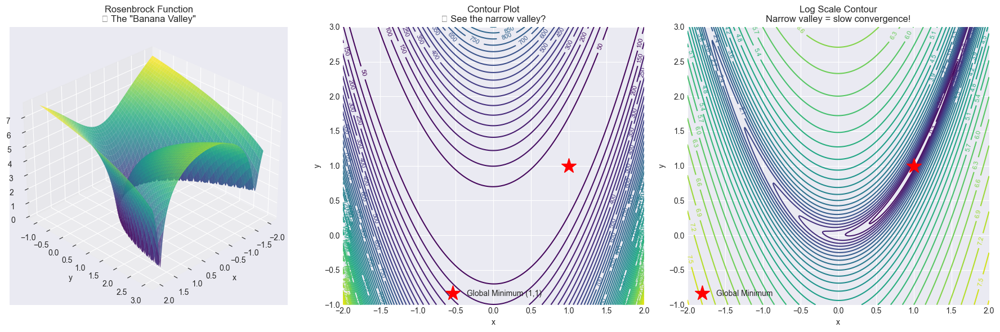

🍌 The Rosenbrock Function:
   Easy to FIND the valley
   HARD to navigate down it
   This is why momentum helps!


In [10]:
def rosenbrock(x, y, a=1, b=100):
    """
    Rosenbrock function: (a-x)² + b(y-x²)²
    Global minimum at (a, a²) = (1, 1) with value 0
    Famous for having a narrow parabolic valley
    """
    return (a - x)**2 + b * (y - x**2)**2

def rosenbrock_gradient(x, y, a=1, b=100):
    """Gradient of Rosenbrock function"""
    grad_x = -2*(a - x) - 4*b*x*(y - x**2)
    grad_y = 2*b*(y - x**2)
    return np.array([grad_x, grad_y])

# Visualize
x_range = np.linspace(-2, 2, 400)
y_range = np.linspace(-1, 3, 400)
X_ros, Y_ros = np.meshgrid(x_range, y_range)
Z_ros = rosenbrock(X_ros, Y_ros)

fig = plt.figure(figsize=(18, 6))

# 3D surface
ax1 = fig.add_subplot(131, projection='3d')
surf = ax1.plot_surface(X_ros, Y_ros, np.log(Z_ros + 1), cmap='viridis', alpha=0.8)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('log(Loss)')
ax1.set_title('Rosenbrock Function\n🍌 The "Banana Valley"')
ax1.view_init(elev=30, azim=45)

# Contour - regular scale
ax2 = fig.add_subplot(132)
contour = ax2.contour(X_ros, Y_ros, Z_ros, levels=50, cmap='viridis')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.plot(1, 1, 'r*', markersize=20, label='Global Minimum (1,1)')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_title('Contour Plot\n👀 See the narrow valley?')
ax2.legend()

# Log scale shows valley better
ax3 = fig.add_subplot(133)
contour = ax3.contour(X_ros, Y_ros, np.log(Z_ros + 1), levels=30, cmap='viridis')
ax3.clabel(contour, inline=True, fontsize=8)
ax3.plot(1, 1, 'r*', markersize=20, label='Global Minimum')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.set_title('Log Scale Contour\nNarrow valley = slow convergence!')
ax3.legend()

plt.tight_layout()
plt.show()

print("🍌 The Rosenbrock Function:")
print("   Easy to FIND the valley")
print("   HARD to navigate down it")
print("   This is why momentum helps!")

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3853088409.py:65: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3853088409.py:65: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()


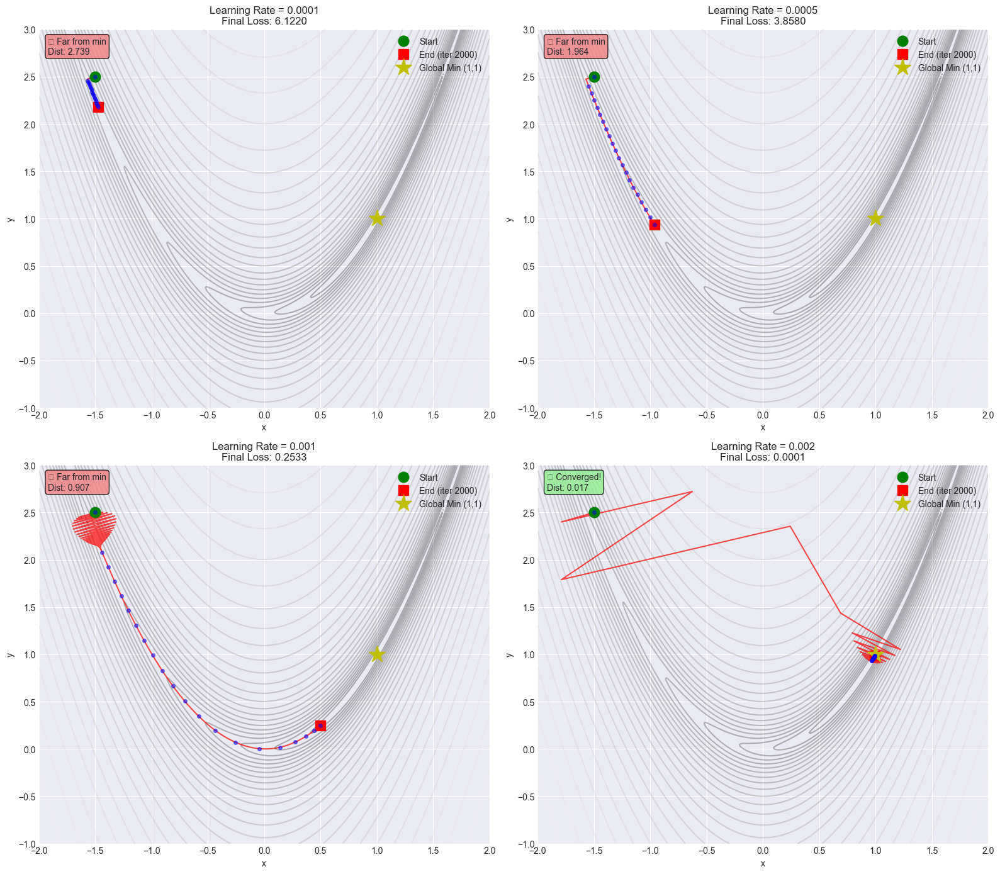

💡 OBSERVATION: Even with 2000 iterations, vanilla GD struggles!
   The narrow valley causes zigzagging
   This is where momentum would help


In [11]:
def run_gd_rosenbrock(init_point, lr, iterations):
    """Run gradient descent on Rosenbrock"""
    point = np.array(init_point, dtype=float)
    history = [point.copy()]
    losses = [rosenbrock(point[0], point[1])]
    
    for i in range(iterations):
        grad = rosenbrock_gradient(point[0], point[1])
        point = point - lr * grad
        history.append(point.copy())
        losses.append(rosenbrock(point[0], point[1]))
    
    return np.array(history), np.array(losses)

# Try different learning rates
learning_rates_ros = [0.0001, 0.0005, 0.001, 0.002]
iterations = 2000
start_point = [-1.5, 2.5]

fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

for idx, lr in enumerate(learning_rates_ros):
    history, losses = run_gd_rosenbrock(start_point, lr, iterations)
    
    ax = axes[idx]
    
    # Contour plot
    contour = ax.contour(X_ros, Y_ros, np.log(Z_ros + 1), levels=30, alpha=0.3, cmap='gray')
    
    # Path
    ax.plot(history[:, 0], history[:, 1], 'r-', linewidth=1.5, alpha=0.7)
    ax.plot(history[0, 0], history[0, 1], 'go', markersize=12, label='Start')
    ax.plot(history[-1, 0], history[-1, 1], 'rs', markersize=12, label=f'End (iter {iterations})')
    ax.plot(1, 1, 'y*', markersize=20, label='Global Min (1,1)')
    
    # Every 100th point
    for i in range(0, len(history), 100):
        ax.plot(history[i, 0], history[i, 1], 'bo', markersize=4, alpha=0.5)
    
    ax.set_xlim(-2, 2)
    ax.set_ylim(-1, 3)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'Learning Rate = {lr}\nFinal Loss: {losses[-1]:.4f}')
    ax.legend()
    
    # Distance from optimum
    final_dist = np.linalg.norm(history[-1] - np.array([1, 1]))
    
    if final_dist < 0.1:
        result = f'✓ Converged!\nDist: {final_dist:.3f}'
        color = 'lightgreen'
    elif final_dist < 0.5:
        result = f'⚠️ Close\nDist: {final_dist:.3f}'
        color = 'lightyellow'
    else:
        result = f'✗ Far from min\nDist: {final_dist:.3f}'
        color = 'lightcoral'
    
    ax.text(0.02, 0.98, result, transform=ax.transAxes,
            ha='left', va='top', fontsize=10,
            bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))

plt.tight_layout()
plt.show()

print("💡 OBSERVATION: Even with 2000 iterations, vanilla GD struggles!")
print("   The narrow valley causes zigzagging")
print("   This is where momentum would help")

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\1078927421.py:31: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\1078927421.py:31: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()


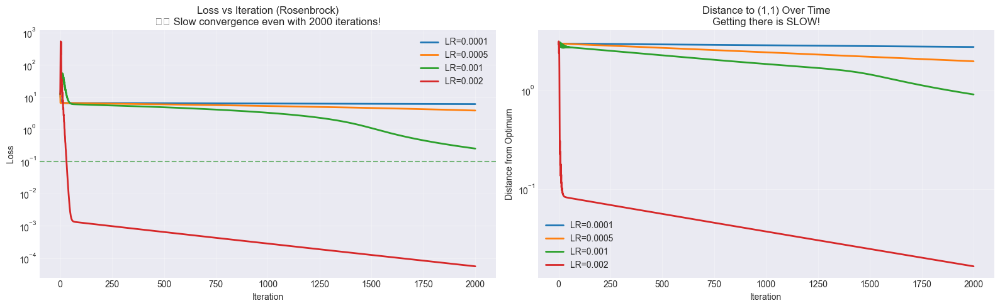

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Loss curves
ax = axes[0]
for lr in learning_rates_ros:
    history, losses = run_gd_rosenbrock(start_point, lr, 2000)
    ax.plot(losses, label=f'LR={lr}', linewidth=2)

ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.set_title('Loss vs Iteration (Rosenbrock)\n⚠️ Slow convergence even with 2000 iterations!')
ax.set_yscale('log')
ax.legend()
ax.grid(True, alpha=0.3)
ax.axhline(y=0.1, color='g', linestyle='--', alpha=0.5, label='Target')

# Distance from optimum
ax = axes[1]
for lr in learning_rates_ros:
    history, losses = run_gd_rosenbrock(start_point, lr, 2000)
    distances = np.linalg.norm(history - np.array([1, 1]), axis=1)
    ax.plot(distances, label=f'LR={lr}', linewidth=2)

ax.set_xlabel('Iteration')
ax.set_ylabel('Distance from Optimum')
ax.set_title('Distance to (1,1) Over Time\nGetting there is SLOW!')
ax.set_yscale('log')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Part 5: Pathological Conditioning (Elongated Bowl)
5.1 The Ill-Conditioned Quadratic

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\666821595.py:52: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\666821595.py:52: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\666821595.py:52: UserWarning: Glyph 128207 (\N{STRAIGHT RULER}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128207 (\N{STRAIGHT RULER}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


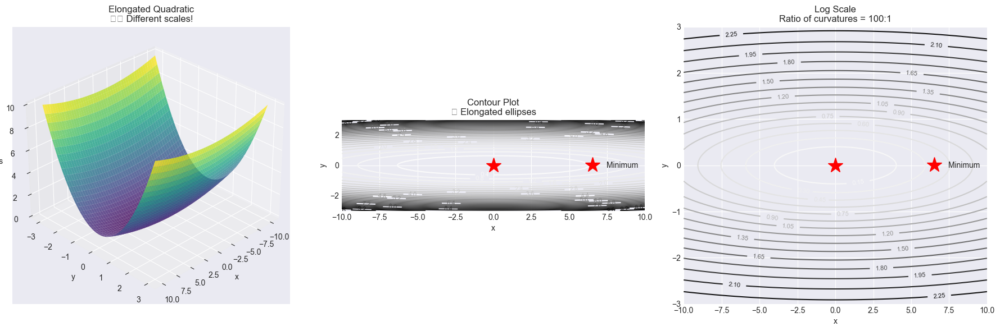

Condition number: 100
High condition number = SLOW convergence
Gradient points toward optimum, but path zigzags!


In [13]:
def elongated_quadratic(x, y, ratio=100):
    """
    Elongated bowl: x²/ratio + y²
    Different curvatures in different directions
    Causes oscillation
    """
    return x**2 / ratio + y**2

def elongated_gradient(x, y, ratio=100):
    """Gradient of elongated quadratic"""
    return np.array([2*x/ratio, 2*y])

# Visualize
ratio = 100
x_range = np.linspace(-10, 10, 300)
y_range = np.linspace(-3, 3, 300)
X_elong, Y_elong = np.meshgrid(x_range, y_range)
Z_elong = elongated_quadratic(X_elong, Y_elong, ratio)

fig = plt.figure(figsize=(18, 6))

# 3D plot
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(X_elong, Y_elong, Z_elong, cmap='viridis', alpha=0.8)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('Loss')
ax1.set_title('Elongated Quadratic\n⚠️ Different scales!')
ax1.view_init(elev=30, azim=45)

# Contour plot
ax2 = fig.add_subplot(132)
contour = ax2.contour(X_elong, Y_elong, Z_elong, levels=30)
ax2.clabel(contour, inline=True, fontsize=8)
ax2.plot(0, 0, 'r*', markersize=20, label='Minimum')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_title('Contour Plot\n📏 Elongated ellipses')
ax2.legend()
ax2.set_aspect('equal')

# Log scale
ax3 = fig.add_subplot(133)
contour = ax3.contour(X_elong, Y_elong, np.log(Z_elong + 1), levels=20)
ax3.clabel(contour, inline=True, fontsize=8)
ax3.plot(0, 0, 'r*', markersize=20, label='Minimum')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.set_title('Log Scale\nRatio of curvatures = 100:1')
ax3.legend()

plt.tight_layout()
plt.show()

print(f"Condition number: {ratio}")
print("High condition number = SLOW convergence")
print("Gradient points toward optimum, but path zigzags!")

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\1483353893.py:63: UserWarning: Glyph 128012 (\N{SNAIL}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\1483353893.py:63: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\1483353893.py:63: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\1483353893.py:63: UserWarning: Glyph 9889 (\N{HIGH VOLTAGE SIGN}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128012 (\N{SNAIL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\

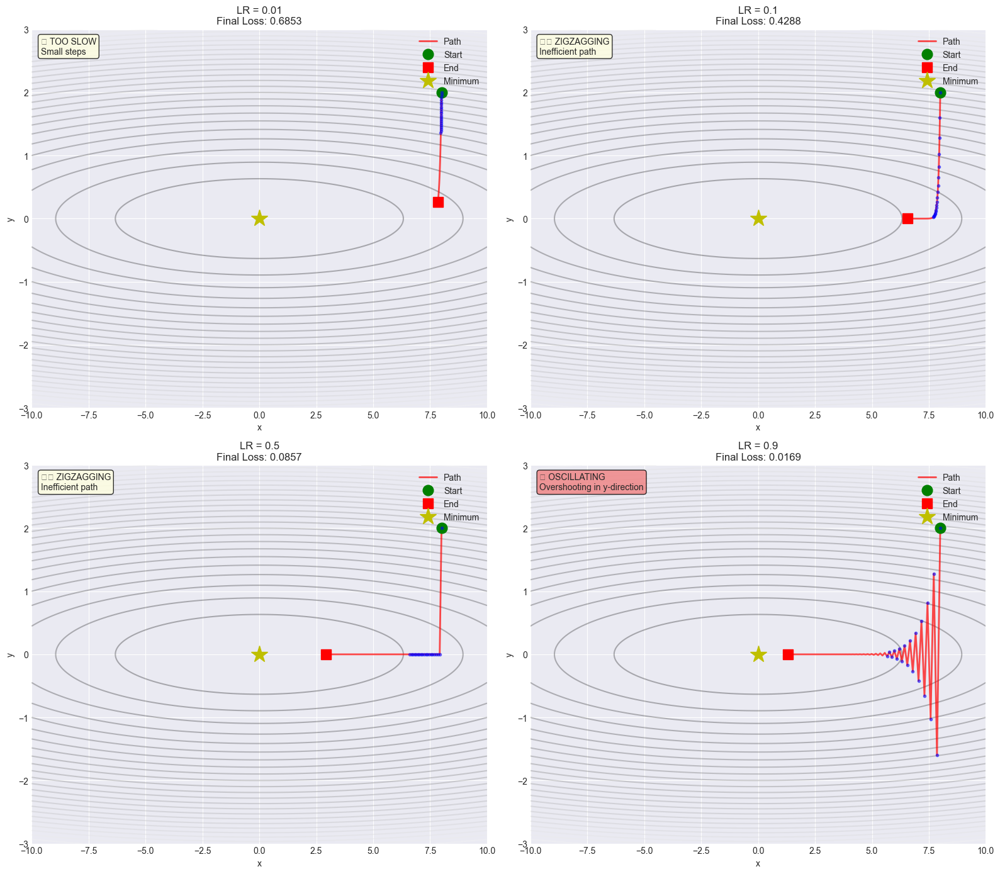

💡 KEY INSIGHT: Elongated landscape causes zigzagging
   Fast movement in y-direction (steep)
   Slow movement in x-direction (flat)
   Solution: Adaptive learning rates (Adam) or momentum!


In [14]:
def run_gd_elongated(init_point, lr, iterations, ratio=100):
    """Run GD on elongated quadratic"""
    point = np.array(init_point, dtype=float)
    history = [point.copy()]
    losses = [elongated_quadratic(point[0], point[1], ratio)]
    
    for i in range(iterations):
        grad = elongated_gradient(point[0], point[1], ratio)
        point = point - lr * grad
        history.append(point.copy())
        losses.append(elongated_quadratic(point[0], point[1], ratio))
    
    return np.array(history), np.array(losses)

# Different learning rates
lrs_elong = [0.01, 0.1, 0.5, 0.9]
start = [8, 2]
iterations = 100

fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

for idx, lr in enumerate(lrs_elong):
    history, losses = run_gd_elongated(start, lr, iterations, ratio)
    
    ax = axes[idx]
    
    # Contour
    contour = ax.contour(X_elong, Y_elong, Z_elong, levels=30, alpha=0.3, cmap='gray')
    
    # Path
    ax.plot(history[:, 0], history[:, 1], 'r-', linewidth=2, alpha=0.7, label='Path')
    ax.plot(history[0, 0], history[0, 1], 'go', markersize=12, label='Start')
    ax.plot(history[-1, 0], history[-1, 1], 'rs', markersize=12, label='End')
    ax.plot(0, 0, 'y*', markersize=20, label='Minimum')
    
    # Show individual steps clearly
    for i in range(min(20, len(history))):
        ax.plot(history[i, 0], history[i, 1], 'bo', markersize=3, alpha=0.5)
    
    ax.set_xlim(-10, 10)
    ax.set_ylim(-3, 3)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'LR = {lr}\nFinal Loss: {losses[-1]:.4f}')
    ax.legend()
    
    # Check behavior
    if lr < 0.05:
        behavior = "🐌 TOO SLOW\nSmall steps"
        color = 'lightyellow'
    elif lr > 0.8:
        behavior = "⚡ OSCILLATING\nOvershooting in y-direction"
        color = 'lightcoral'
    else:
        behavior = "⚠️ ZIGZAGGING\nInefficient path"
        color = 'lightyellow'
    
    ax.text(0.02, 0.98, behavior, transform=ax.transAxes,
            ha='left', va='top', fontsize=10,
            bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))

plt.tight_layout()
plt.show()

print("💡 KEY INSIGHT: Elongated landscape causes zigzagging")
print("   Fast movement in y-direction (steep)")
print("   Slow movement in x-direction (flat)")
print("   Solution: Adaptive learning rates (Adam) or momentum!")

Part 6: Saddle Points (The Plateau Problem)
6.1 Saddle Point Function

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\4056834796.py:55: UserWarning: Glyph 128052 (\N{HORSE FACE}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128052 (\N{HORSE FACE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


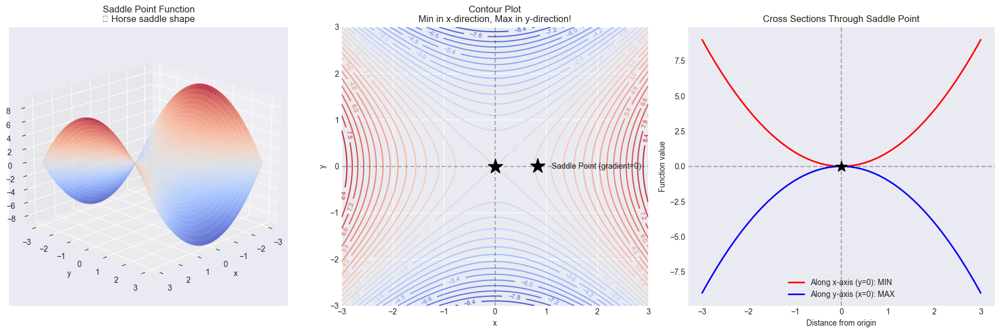

🐴 Saddle Points:
   Gradient = 0, but NOT a minimum!
   In neural networks, saddle points are EVERYWHERE
   Can slow down or trap optimization


In [16]:
def saddle_function(x, y):
    """
    Saddle point at origin: x² - y²
    Not a minimum OR maximum - a saddle!
    """
    return x**2 - y**2

def saddle_gradient(x, y):
    """Gradient of saddle function"""
    return np.array([2*x, -2*y])

# Visualize
x_range = np.linspace(-3, 3, 200)
y_range = np.linspace(-3, 3, 200)
X_sad, Y_sad = np.meshgrid(x_range, y_range)
Z_sad = saddle_function(X_sad, Y_sad)

fig = plt.figure(figsize=(18, 6))

# 3D surface
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(X_sad, Y_sad, Z_sad, cmap='coolwarm', alpha=0.8)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('Loss')
ax1.set_title('Saddle Point Function\n🐴 Horse saddle shape')
ax1.view_init(elev=20, azim=45)

# Contour
ax2 = fig.add_subplot(132)
contour = ax2.contour(X_sad, Y_sad, Z_sad, levels=30, cmap='coolwarm')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.plot(0, 0, 'k*', markersize=20, label='Saddle Point (gradient=0)')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_title('Contour Plot\nMin in x-direction, Max in y-direction!')
ax2.legend()
ax2.axhline(y=0, color='k', linestyle='--', alpha=0.3)
ax2.axvline(x=0, color='k', linestyle='--', alpha=0.3)

# Cross sections
ax3 = fig.add_subplot(133)
x_line = np.linspace(-3, 3, 100)
ax3.plot(x_line, x_line**2, 'r-', linewidth=2, label='Along x-axis (y=0): MIN')
ax3.plot(x_line, -x_line**2, 'b-', linewidth=2, label='Along y-axis (x=0): MAX')
ax3.axhline(y=0, color='k', linestyle='--', alpha=0.3)
ax3.axvline(x=0, color='k', linestyle='--', alpha=0.3)
ax3.plot(0, 0, 'k*', markersize=15)
ax3.set_xlabel('Distance from origin')
ax3.set_ylabel('Function value')
ax3.set_title('Cross Sections Through Saddle Point')
ax3.legend()
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("🐴 Saddle Points:")
print("   Gradient = 0, but NOT a minimum!")
print("   In neural networks, saddle points are EVERYWHERE")
print("   Can slow down or trap optimization")

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\1562405795.py:68: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()


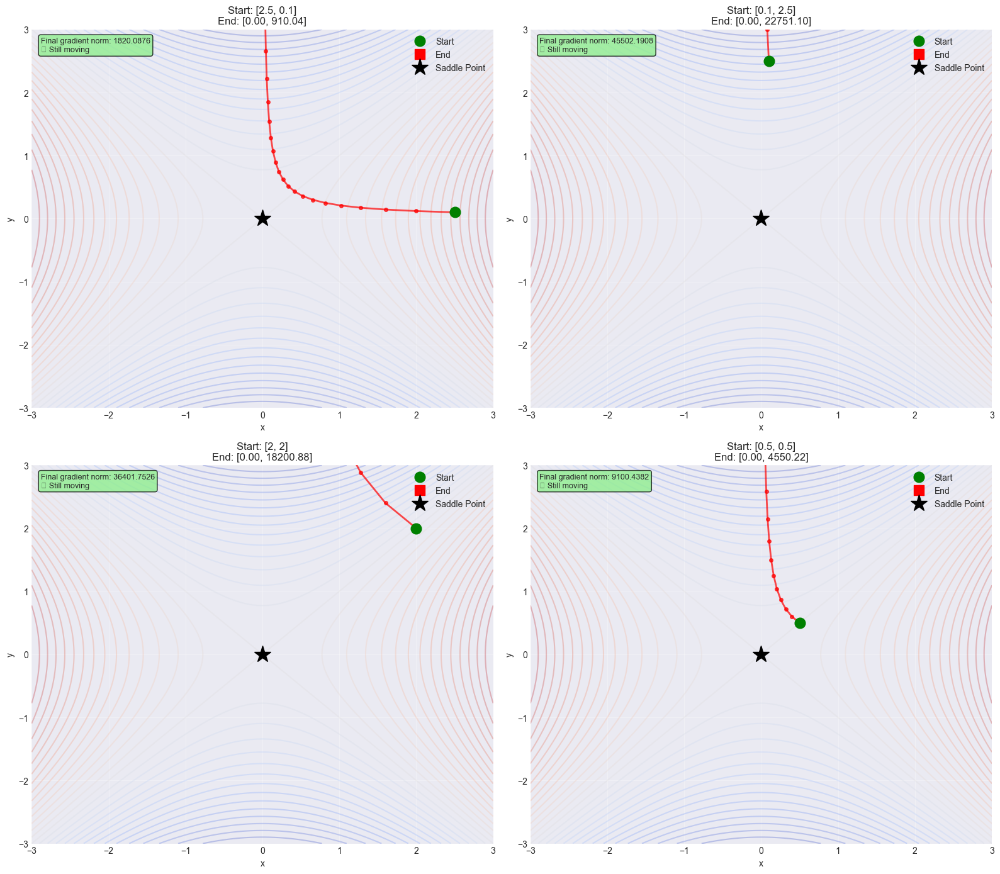

⚠️ CRITICAL INSIGHT: Saddle points slow down optimization
   Common in high-dimensional spaces (neural networks)
   Momentum and noise (SGD) help escape saddle points


In [17]:
def run_gd_saddle(init_point, lr, iterations):
    """Run GD on saddle function"""
    point = np.array(init_point, dtype=float)
    history = [point.copy()]
    losses = [saddle_function(point[0], point[1])]
    
    for i in range(iterations):
        grad = saddle_gradient(point[0], point[1])
        point = point - lr * grad
        history.append(point.copy())
        losses.append(saddle_function(point[0], point[1]))
    
    return np.array(history), np.array(losses)

# Try different starting points
starts_saddle = [
    [2.5, 0.1],   # Near x-axis
    [0.1, 2.5],   # Near y-axis
    [2, 2],       # Diagonal
    [0.5, 0.5],   # Close to saddle
]

fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

lr = 0.1
iterations = 50

for idx, start in enumerate(starts_saddle):
    history, losses = run_gd_saddle(start, lr, iterations)
    
    ax = axes[idx]
    
    # Contour
    contour = ax.contour(X_sad, Y_sad, Z_sad, levels=30, alpha=0.3, cmap='coolwarm')
    
    # Path
    ax.plot(history[:, 0], history[:, 1], 'r-', linewidth=2, marker='o', 
            markersize=4, alpha=0.7)
    ax.plot(history[0, 0], history[0, 1], 'go', markersize=12, label='Start')
    ax.plot(history[-1, 0], history[-1, 1], 'rs', markersize=12, label='End')
    ax.plot(0, 0, 'k*', markersize=20, label='Saddle Point')
    
    ax.set_xlim(-3, 3)
    ax.set_ylim(-3, 3)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'Start: {start}\nEnd: [{history[-1,0]:.2f}, {history[-1,1]:.2f}]')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Show gradient at final point
    final_grad = saddle_gradient(history[-1, 0], history[-1, 1])
    grad_norm = np.linalg.norm(final_grad)
    
    info = f'Final gradient norm: {grad_norm:.4f}'
    if grad_norm < 0.1:
        info += '\n⚠️ Nearly zero gradient!\nStuck near saddle'
        color = 'yellow'
    else:
        info += '\n✓ Still moving'
        color = 'lightgreen'
    
    ax.text(0.02, 0.98, info, transform=ax.transAxes,
            ha='left', va='top', fontsize=9,
            bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))

plt.tight_layout()
plt.show()

print("⚠️ CRITICAL INSIGHT: Saddle points slow down optimization")
print("   Common in high-dimensional spaces (neural networks)")
print("   Momentum and noise (SGD) help escape saddle points")

Part 7: Summary - Why Advanced Methods Exist
7.1 The Complete Picture

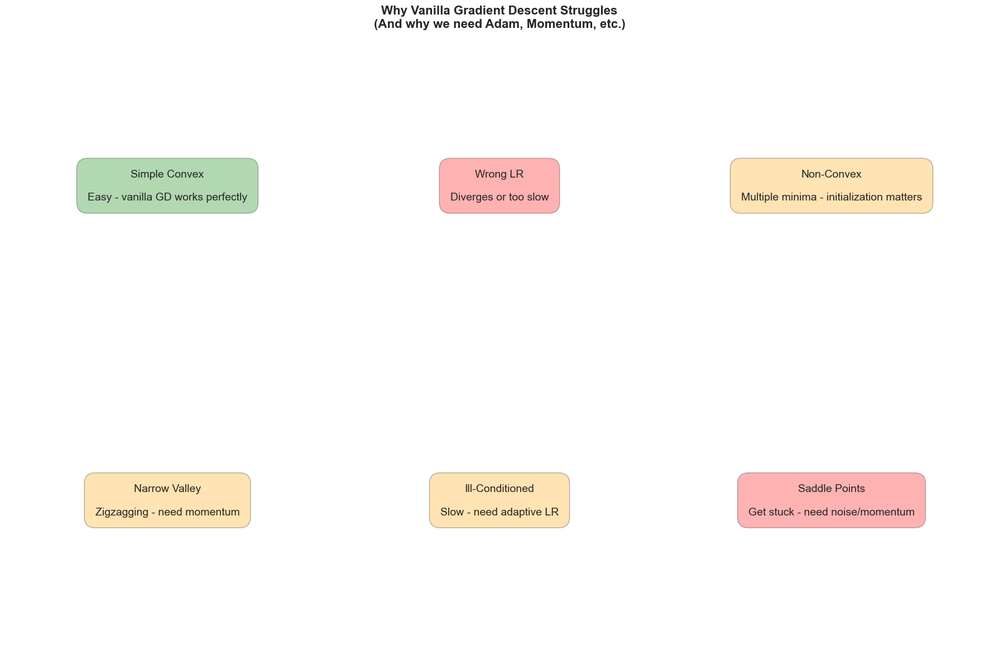

In [18]:
# Create summary visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

problems = [
    ('Simple Convex', 'Easy - vanilla GD works perfectly', 'green'),
    ('Wrong LR', 'Diverges or too slow', 'red'),
    ('Non-Convex', 'Multiple minima - initialization matters', 'orange'),
    ('Narrow Valley', 'Zigzagging - need momentum', 'orange'),
    ('Ill-Conditioned', 'Slow - need adaptive LR', 'orange'),
    ('Saddle Points', 'Get stuck - need noise/momentum', 'red'),
]

for idx, (title, issue, color) in enumerate(problems):
    ax = axes[idx // 3, idx % 3]
    ax.text(0.5, 0.5, f'{title}\n\n{issue}', 
            ha='center', va='center', fontsize=14,
            bbox=dict(boxstyle='round,pad=1', facecolor=color, alpha=0.3),
            wrap=True)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')

plt.suptitle('Why Vanilla Gradient Descent Struggles\n(And why we need Adam, Momentum, etc.)',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

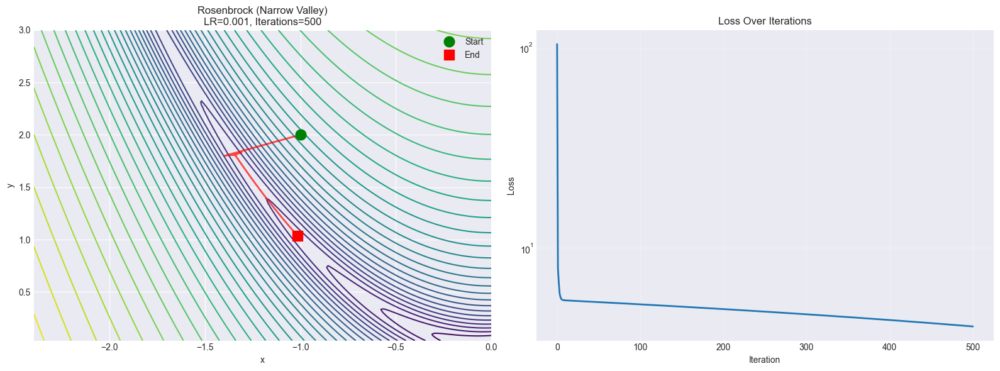


Started at: [-1.  2.]
Ended at: [-1.01413403  1.03645507]
Final loss: 4.063115
Distance traveled: 1.54


In [19]:
# Interactive cell - modify these!
FUNCTION = 'rosenbrock'  # Options: 'simple', 'rastrigin', 'rosenbrock', 'elongated', 'saddle'
LEARNING_RATE = 0.001
ITERATIONS = 500
START_POINT = [-1.0, 2.0]

# Function dispatcher
functions = {
    'simple': (
        lambda x, y: (x-5)**2 + (y-3)**2,
        lambda x, y: np.array([2*(x-5), 2*(y-3)]),
        'Simple Quadratic'
    ),
    'rastrigin': (
        rastrigin,
        rastrigin_gradient,
        'Rastrigin (Many Local Minima)'
    ),
    'rosenbrock': (
        rosenbrock,
        rosenbrock_gradient,
        'Rosenbrock (Narrow Valley)'
    ),
    'elongated': (
        elongated_quadratic,
        elongated_gradient,
        'Elongated Quadratic (Ill-Conditioned)'
    ),
    'saddle': (
        saddle_function,
        saddle_gradient,
        'Saddle Point'
    )
}

func, grad_func, name = functions[FUNCTION]

# Run optimization
def run_custom_gd(func, grad_func, start, lr, iters):
    point = np.array(start, dtype=float)
    history = [point.copy()]
    
    for i in range(iters):
        grad = grad_func(point[0], point[1])
        point = point - lr * grad
        history.append(point.copy())
        
        # Stop if diverging
        if np.any(np.abs(point) > 100):
            print(f"⚠️ Diverged at iteration {i}")
            break
    
    return np.array(history)

history = run_custom_gd(func, grad_func, START_POINT, LEARNING_RATE, ITERATIONS)

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Create meshgrid for chosen function
x_r = np.linspace(history[:, 0].min()-1, history[:, 0].max()+1, 200)
y_r = np.linspace(history[:, 1].min()-1, history[:, 1].max()+1, 200)
X_plot, Y_plot = np.meshgrid(x_r, y_r)
Z_plot = func(X_plot, Y_plot)

# Path on contour
ax = axes[0]
contour = ax.contour(X_plot, Y_plot, np.log(Z_plot + 1), levels=30, cmap='viridis')
ax.plot(history[:, 0], history[:, 1], 'r-', linewidth=2, alpha=0.7)
ax.plot(history[0, 0], history[0, 1], 'go', markersize=12, label='Start')
ax.plot(history[-1, 0], history[-1, 1], 'rs', markersize=12, label='End')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title(f'{name}\nLR={LEARNING_RATE}, Iterations={len(history)-1}')
ax.legend()

# Loss over iterations
ax = axes[1]
losses = [func(h[0], h[1]) for h in history]
ax.plot(losses, linewidth=2)
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.set_title('Loss Over Iterations')
ax.set_yscale('log')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nStarted at: {history[0]}")
print(f"Ended at: {history[-1]}")
print(f"Final loss: {losses[-1]:.6f}")
print(f"Distance traveled: {np.sum(np.linalg.norm(np.diff(history, axis=0), axis=1)):.2f}")

Why MSE is Convex for Linear Regression but NOT for Neural Networks
The Fundamental Difference

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generate simple data
np.random.seed(42)
x = np.linspace(0, 5, 50)
y_true = 3 + 2*x
y = y_true + np.random.normal(0, 1, size=50)

print("="*80)
print("LINEAR REGRESSION: y = θ₀ + θ₁·x")
print("="*80)
print("\nMSE Loss: L(θ₀, θ₁) = (1/n)Σ(y - θ₀ - θ₁·x)²")
print("\nKey insight: This is QUADRATIC in θ₀ and θ₁")
print("Quadratic function → Always convex! (Perfect parabola/bowl)")
print("="*80)

LINEAR REGRESSION: y = θ₀ + θ₁·x

MSE Loss: L(θ₀, θ₁) = (1/n)Σ(y - θ₀ - θ₁·x)²

Key insight: This is QUADRATIC in θ₀ and θ₁
Quadratic function → Always convex! (Perfect parabola/bowl)


C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3647554794.py:53: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3647554794.py:53: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3647554794.py:53: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Arial.
  plt.tight_layout()


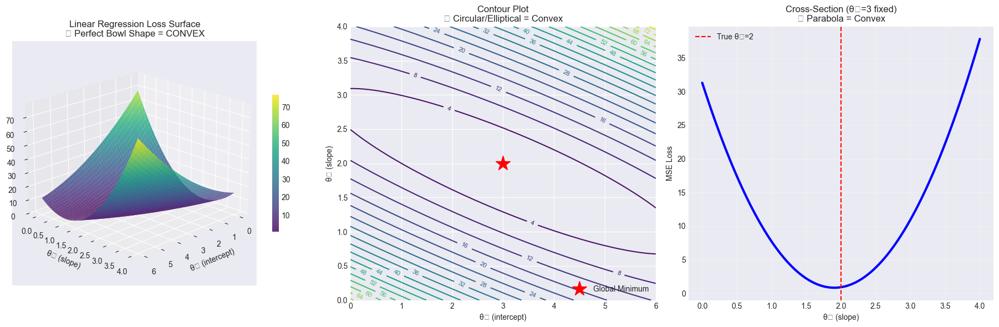


✓ OBSERVATION: Loss surface is a perfect bowl
✓ ONE global minimum
✓ NO local minima
✓ Gradient descent GUARANTEED to converge from ANY starting point


In [21]:
def mse_linear(theta0, theta1, x, y):
    """MSE for linear regression"""
    predictions = theta0 + theta1 * x
    return np.mean((y - predictions)**2)

# Create grid of parameter values
theta0_range = np.linspace(0, 6, 100)
theta1_range = np.linspace(0, 4, 100)
T0, T1 = np.meshgrid(theta0_range, theta1_range)

# Compute loss at each point
Z_linear = np.zeros_like(T0)
for i in range(len(theta0_range)):
    for j in range(len(theta1_range)):
        Z_linear[j, i] = mse_linear(T0[j, i], T1[j, i], x, y)

# Visualize
fig = plt.figure(figsize=(18, 6))

# 3D surface
ax1 = fig.add_subplot(131, projection='3d')
surf = ax1.plot_surface(T0, T1, Z_linear, cmap='viridis', alpha=0.8, edgecolor='none')
ax1.set_xlabel('θ₀ (intercept)', fontsize=10)
ax1.set_ylabel('θ₁ (slope)', fontsize=10)
ax1.set_zlabel('MSE Loss', fontsize=10)
ax1.set_title('Linear Regression Loss Surface\n✓ Perfect Bowl Shape = CONVEX', fontsize=12)
ax1.view_init(elev=20, azim=45)
fig.colorbar(surf, ax=ax1, shrink=0.5)

# Contour plot
ax2 = fig.add_subplot(132)
contour = ax2.contour(T0, T1, Z_linear, levels=20, cmap='viridis')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.set_xlabel('θ₀ (intercept)')
ax2.set_ylabel('θ₁ (slope)')
ax2.set_title('Contour Plot\n✓ Circular/Elliptical = Convex')
# Mark true minimum
ax2.plot(3, 2, 'r*', markersize=20, label='Global Minimum')
ax2.legend()

# Cross-section along θ₁ (fixing θ₀=3)
ax3 = fig.add_subplot(133)
theta1_line = np.linspace(0, 4, 100)
losses = [mse_linear(3, t1, x, y) for t1 in theta1_line]
ax3.plot(theta1_line, losses, 'b-', linewidth=3)
ax3.axvline(x=2, color='r', linestyle='--', label='True θ₁=2')
ax3.set_xlabel('θ₁ (slope)')
ax3.set_ylabel('MSE Loss')
ax3.set_title('Cross-Section (θ₀=3 fixed)\n✓ Parabola = Convex')
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

print("\n✓ OBSERVATION: Loss surface is a perfect bowl")
print("✓ ONE global minimum")
print("✓ NO local minima")
print("✓ Gradient descent GUARANTEED to converge from ANY starting point")

In [22]:
print("\n" + "="*80)
print("MATHEMATICAL REASON: LINEAR REGRESSION MSE IS CONVEX")
print("="*80)

explanation = """
Loss function: L(θ) = (1/n)Σ(y_i - θ₀ - θ₁·x_i)²

Expand:
L(θ) = (1/n)Σ[(y_i - θ₀ - θ₁·x_i)(y_i - θ₀ - θ₁·x_i)]
     = (1/n)Σ[y_i² - 2y_i·θ₀ - 2y_i·θ₁·x_i + θ₀² + 2θ₀·θ₁·x_i + θ₁²·x_i²]

This is a QUADRATIC function in θ₀ and θ₁:
L(θ) = aθ₀² + bθ₁² + cθ₀θ₁ + dθ₀ + eθ₁ + f

Key properties:
1. Highest power: θ² (quadratic, not θ³ or higher)
2. Coefficients a, b > 0 (positive definite)
3. Hessian matrix (matrix of second derivatives) is POSITIVE DEFINITE

Result: CONVEX function (bowl shape)
       ⟹ ONE global minimum
       ⟹ Gradient descent always converges
"""

print(explanation)
print("="*80)


MATHEMATICAL REASON: LINEAR REGRESSION MSE IS CONVEX

Loss function: L(θ) = (1/n)Σ(y_i - θ₀ - θ₁·x_i)²

Expand:
L(θ) = (1/n)Σ[(y_i - θ₀ - θ₁·x_i)(y_i - θ₀ - θ₁·x_i)]
     = (1/n)Σ[y_i² - 2y_i·θ₀ - 2y_i·θ₁·x_i + θ₀² + 2θ₀·θ₁·x_i + θ₁²·x_i²]

This is a QUADRATIC function in θ₀ and θ₁:
L(θ) = aθ₀² + bθ₁² + cθ₀θ₁ + dθ₀ + eθ₁ + f

Key properties:
1. Highest power: θ² (quadratic, not θ³ or higher)
2. Coefficients a, b > 0 (positive definite)
3. Hessian matrix (matrix of second derivatives) is POSITIVE DEFINITE

Result: CONVEX function (bowl shape)
       ⟹ ONE global minimum
       ⟹ Gradient descent always converges



Part 2: Neural Network - NON-Convex
2.1 Simple Neural Network

In [23]:
print("\n" + "="*80)
print("NEURAL NETWORK (MLP): Non-linear activation functions")
print("="*80)

def sigmoid(z):
    """Sigmoid activation"""
    return 1 / (1 + np.exp(-np.clip(z, -500, 500)))  # Clip to avoid overflow

def neural_net_1hidden(x, w1, w2, b1, b2):
    """
    Simple neural network with 1 hidden layer
    
    Input: x
    Hidden: h = sigmoid(w1·x + b1)
    Output: y = w2·h + b2
    """
    h = sigmoid(w1 * x + b1)  # Hidden layer with non-linear activation
    y = w2 * h + b2            # Output layer
    return y

def mse_neural_net(w1, w2, b1, b2, x, y_true):
    """MSE loss for neural network"""
    predictions = neural_net_1hidden(x, w1, w2, b1, b2)
    return np.mean((y_true - predictions)**2)

print("\nNeural Network:")
print("  y = w2 · sigmoid(w1·x + b1) + b2")
print("\nKey difference: SIGMOID is NON-LINEAR")
print("This makes the loss function NON-CONVEX in parameters!")
print("="*80)


NEURAL NETWORK (MLP): Non-linear activation functions

Neural Network:
  y = w2 · sigmoid(w1·x + b1) + b2

Key difference: SIGMOID is NON-LINEAR
This makes the loss function NON-CONVEX in parameters!


C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\112835107.py:51: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\112835107.py:51: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\112835107.py:51: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\112835107.py:51: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\maxgn\Digital Assets Trading\assignment5_1_starter\project_assignment_5_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


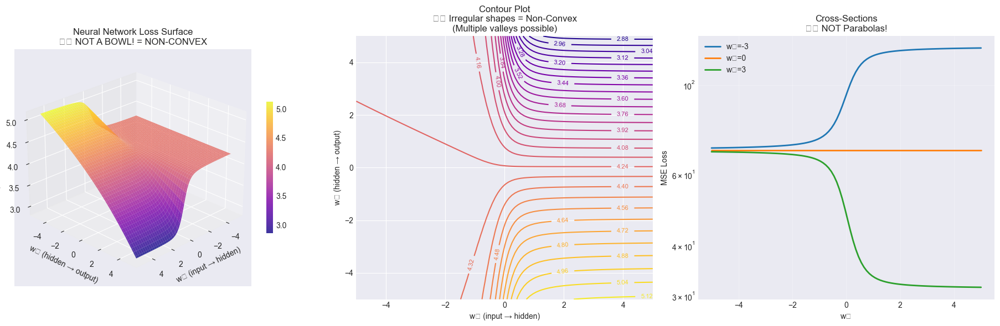


⚠️ OBSERVATION: Loss surface is BUMPY, not smooth
⚠️ Multiple valleys, ridges, and saddle points
⚠️ NO guarantee of finding global minimum
⚠️ Starting point MATTERS!


In [24]:
# Fix b1=0, b2=0 for visualization (2D parameter space)
b1_fixed, b2_fixed = 0, 0

# Create grid
w1_range = np.linspace(-5, 5, 100)
w2_range = np.linspace(-5, 5, 100)
W1, W2 = np.meshgrid(w1_range, w2_range)

# Compute loss (this takes a moment)
Z_nn = np.zeros_like(W1)
for i in range(len(w1_range)):
    for j in range(len(w2_range)):
        Z_nn[j, i] = mse_neural_net(W1[j, i], W2[j, i], b1_fixed, b2_fixed, x, y)

# Visualize
fig = plt.figure(figsize=(18, 6))

# 3D surface
ax1 = fig.add_subplot(131, projection='3d')
# Use log scale to see structure better
Z_nn_plot = np.log(Z_nn + 1)
surf = ax1.plot_surface(W1, W2, Z_nn_plot, cmap='plasma', alpha=0.8, edgecolor='none')
ax1.set_xlabel('w₁ (input → hidden)', fontsize=10)
ax1.set_ylabel('w₂ (hidden → output)', fontsize=10)
ax1.set_zlabel('log(MSE Loss)', fontsize=10)
ax1.set_title('Neural Network Loss Surface\n⚠️ NOT A BOWL! = NON-CONVEX', fontsize=12)
ax1.view_init(elev=25, azim=45)
fig.colorbar(surf, ax=ax1, shrink=0.5)

# Contour plot
ax2 = fig.add_subplot(132)
contour = ax2.contour(W1, W2, Z_nn_plot, levels=30, cmap='plasma')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.set_xlabel('w₁ (input → hidden)')
ax2.set_ylabel('w₂ (hidden → output)')
ax2.set_title('Contour Plot\n⚠️ Irregular shapes = Non-Convex\n(Multiple valleys possible)')

# Cross-section along w1 (fixing w2)
ax3 = fig.add_subplot(133)
w2_fix_values = [-3, 0, 3]
for w2_fix in w2_fix_values:
    losses = [mse_neural_net(w1, w2_fix, b1_fixed, b2_fixed, x, y) for w1 in w1_range]
    ax3.plot(w1_range, losses, linewidth=2, label=f'w₂={w2_fix}')
ax3.set_xlabel('w₁')
ax3.set_ylabel('MSE Loss')
ax3.set_title('Cross-Sections\n⚠️ NOT Parabolas!')
ax3.set_yscale('log')
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

print("\n⚠️ OBSERVATION: Loss surface is BUMPY, not smooth")
print("⚠️ Multiple valleys, ridges, and saddle points")
print("⚠️ NO guarantee of finding global minimum")
print("⚠️ Starting point MATTERS!")

In [25]:
print("\n" + "="*80)
print("WHY NEURAL NETWORK MSE IS NON-CONVEX")
print("="*80)

explanation = """
Neural Network: y = w2·σ(w1·x + b1) + b2
                      ↑
                   sigmoid (non-linear!)

Loss: L(w1, w2) = (1/n)Σ[y_true - w2·σ(w1·x + b1) - b2]²

The problem: σ(w1·x + b1) is NON-LINEAR in w1

Expand:
L(w) = (1/n)Σ[y - w2·σ(w1·x + b1) - b2]²

This is NOT quadratic in w1 because:
- σ(z) = 1/(1+e^(-z)) is transcendental (exponential function)
- Cannot be written as polynomial in w1
- Creates complex, non-convex landscape

Result: NON-CONVEX function
       ⟹ Multiple local minima possible
       ⟹ Saddle points
       ⟹ Gradient descent may get stuck
       ⟹ Initialization matters!

KEY INSIGHT:
- Linear model: y = θ·x  → Convex loss
- + Non-linear activation → Non-convex loss
"""

print(explanation)
print("="*80)


WHY NEURAL NETWORK MSE IS NON-CONVEX

Neural Network: y = w2·σ(w1·x + b1) + b2
                      ↑
                   sigmoid (non-linear!)

Loss: L(w1, w2) = (1/n)Σ[y_true - w2·σ(w1·x + b1) - b2]²

The problem: σ(w1·x + b1) is NON-LINEAR in w1

Expand:
L(w) = (1/n)Σ[y - w2·σ(w1·x + b1) - b2]²

This is NOT quadratic in w1 because:
- σ(z) = 1/(1+e^(-z)) is transcendental (exponential function)
- Cannot be written as polynomial in w1
- Creates complex, non-convex landscape

Result: NON-CONVEX function
       ⟹ Multiple local minima possible
       ⟹ Saddle points
       ⟹ Gradient descent may get stuck
       ⟹ Initialization matters!

KEY INSIGHT:
- Linear model: y = θ·x  → Convex loss
- + Non-linear activation → Non-convex loss



In [26]:
def gradient_descent_linear(x, y, lr, iterations, init_params):
    """GD for linear regression"""
    theta = np.array(init_params, dtype=float)
    history = [theta.copy()]
    
    for i in range(iterations):
        # Predictions
        pred = theta[0] + theta[1] * x
        # Gradient
        grad_theta0 = -2 * np.mean(y - pred)
        grad_theta1 = -2 * np.mean((y - pred) * x)
        # Update
        theta[0] -= lr * grad_theta0
        theta[1] -= lr * grad_theta1
        history.append(theta.copy())
    
    return np.array(history)

def gradient_descent_nn(x, y, lr, iterations, init_params):
    """GD for neural network (simplified - numerical gradients)"""
    params = np.array(init_params, dtype=float)  # [w1, w2]
    b1, b2 = 0, 0  # Fixed for simplicity
    history = [params.copy()]
    
    epsilon = 1e-5
    
    for i in range(iterations):
        # Numerical gradients (finite differences)
        loss_current = mse_neural_net(params[0], params[1], b1, b2, x, y)
        
        # Gradient w.r.t. w1
        loss_w1_plus = mse_neural_net(params[0] + epsilon, params[1], b1, b2, x, y)
        grad_w1 = (loss_w1_plus - loss_current) / epsilon
        
        # Gradient w.r.t. w2
        loss_w2_plus = mse_neural_net(params[0], params[1] + epsilon, b1, b2, x, y)
        grad_w2 = (loss_w2_plus - loss_current) / epsilon
        
        # Update
        params[0] -= lr * grad_w1
        params[1] -= lr * grad_w2
        history.append(params.copy())
    
    return np.array(history)

# Run GD from SAME starting point
start_point = [0.5, 0.5]
lr = 0.01
iterations = 200

print("\nRunning Gradient Descent from same starting point...")
print(f"Start: {start_point}, LR: {lr}, Iterations: {iterations}")

history_linear = gradient_descent_linear(x, y, lr, iterations, start_point)
history_nn = gradient_descent_nn(x, y, lr, iterations, start_point)

print(f"\nLinear Regression:")
print(f"  Final params: θ₀={history_linear[-1,0]:.3f}, θ₁={history_linear[-1,1]:.3f}")
print(f"  Final loss: {mse_linear(history_linear[-1,0], history_linear[-1,1], x, y):.4f}")

print(f"\nNeural Network:")
print(f"  Final params: w₁={history_nn[-1,0]:.3f}, w₂={history_nn[-1,1]:.3f}")
print(f"  Final loss: {mse_neural_net(history_nn[-1,0], history_nn[-1,1], 0, 0, x, y):.4f}")


Running Gradient Descent from same starting point...
Start: [0.5, 0.5], LR: 0.01, Iterations: 200

Linear Regression:
  Final params: θ₀=2.305, θ₁=2.116
  Final loss: 0.9742

Neural Network:
  Final params: w₁=0.932, w₂=8.671
  Final loss: 3.9538


C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2881459815.py:25: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2881459815.py:25: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2881459815.py:25: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2881459815.py:25: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2881459815.py:25: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2881459815.py:25: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()


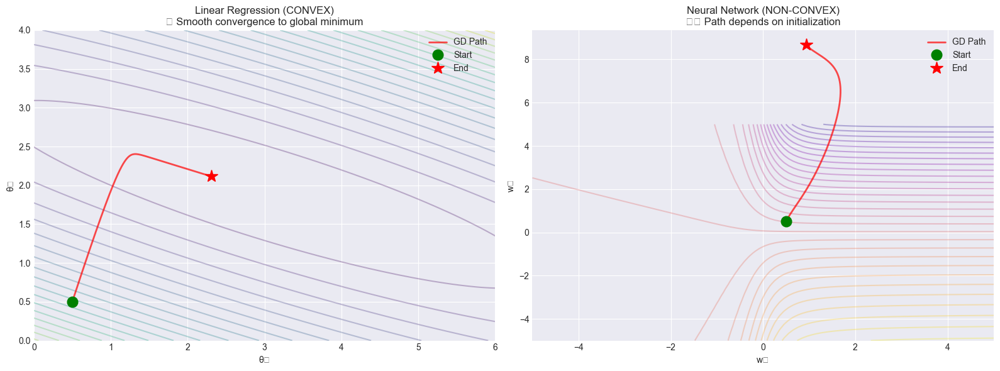

In [27]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Linear regression path
ax = axes[0]
contour = ax.contour(T0, T1, Z_linear, levels=20, alpha=0.3, cmap='viridis')
ax.plot(history_linear[:, 0], history_linear[:, 1], 'r-', linewidth=2, alpha=0.7, label='GD Path')
ax.plot(history_linear[0, 0], history_linear[0, 1], 'go', markersize=12, label='Start')
ax.plot(history_linear[-1, 0], history_linear[-1, 1], 'r*', markersize=15, label='End')
ax.set_xlabel('θ₀')
ax.set_ylabel('θ₁')
ax.set_title('Linear Regression (CONVEX)\n✓ Smooth convergence to global minimum')
ax.legend()

# Neural network path
ax = axes[1]
contour = ax.contour(W1, W2, Z_nn_plot, levels=30, alpha=0.3, cmap='plasma')
ax.plot(history_nn[:, 0], history_nn[:, 1], 'r-', linewidth=2, alpha=0.7, label='GD Path')
ax.plot(history_nn[0, 0], history_nn[0, 1], 'go', markersize=12, label='Start')
ax.plot(history_nn[-1, 0], history_nn[-1, 1], 'r*', markersize=15, label='End')
ax.set_xlabel('w₁')
ax.set_ylabel('w₂')
ax.set_title('Neural Network (NON-CONVEX)\n⚠️ Path depends on initialization')
ax.legend()

plt.tight_layout()
plt.show()

Part 4: The Initialization Experiment
4.1 Multiple Random Starts - Neural Network


Running 20 trials with different initializations...


C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3862947645.py:52: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3862947645.py:52: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3862947645.py:52: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\3862947645.py:52: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()


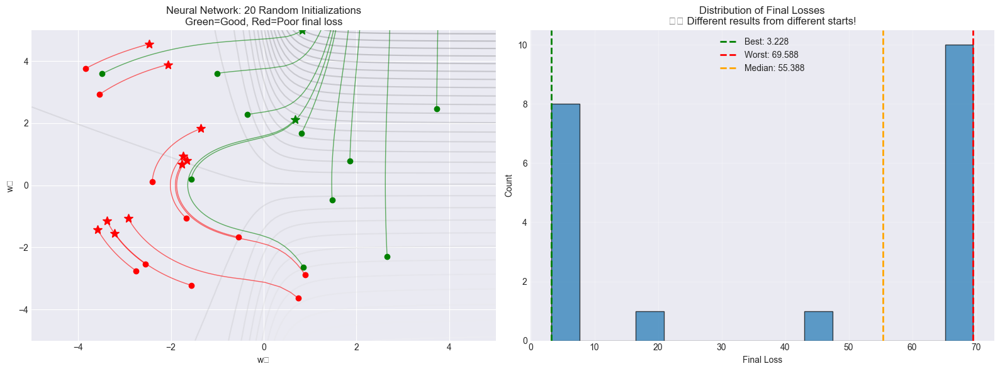


Results:
  Best loss:  3.2282
  Worst loss: 69.5878
  Ratio: 21.56x worse!

⚠️ Same algorithm, same data, DIFFERENT results!
   This is NON-CONVEXITY in action


In [28]:
# Try many random initializations for neural network
n_trials = 20
np.random.seed(42)

start_points = np.random.uniform(-4, 4, size=(n_trials, 2))
final_losses = []
final_params = []

print(f"\nRunning {n_trials} trials with different initializations...")

for i, start in enumerate(start_points):
    history = gradient_descent_nn(x, y, lr=0.01, iterations=300, init_params=start)
    final_loss = mse_neural_net(history[-1, 0], history[-1, 1], 0, 0, x, y)
    final_losses.append(final_loss)
    final_params.append(history[-1])

final_losses = np.array(final_losses)
final_params = np.array(final_params)

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# All paths
ax = axes[0]
contour = ax.contour(W1, W2, np.log(Z_nn + 1), levels=30, alpha=0.2, cmap='gray')

for i, start in enumerate(start_points):
    history = gradient_descent_nn(x, y, lr=0.01, iterations=300, init_params=start)
    color = 'green' if final_losses[i] < np.median(final_losses) else 'red'
    ax.plot(history[:, 0], history[:, 1], '-', linewidth=1, alpha=0.6, color=color)
    ax.plot(start[0], start[1], 'o', color=color, markersize=6)
    ax.plot(history[-1, 0], history[-1, 1], '*', color=color, markersize=10)

ax.set_xlabel('w₁')
ax.set_ylabel('w₂')
ax.set_title(f'Neural Network: {n_trials} Random Initializations\nGreen=Good, Red=Poor final loss')
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)

# Distribution of final losses
ax = axes[1]
ax.hist(final_losses, bins=15, edgecolor='black', alpha=0.7)
ax.axvline(np.min(final_losses), color='g', linestyle='--', linewidth=2, label=f'Best: {np.min(final_losses):.3f}')
ax.axvline(np.max(final_losses), color='r', linestyle='--', linewidth=2, label=f'Worst: {np.max(final_losses):.3f}')
ax.axvline(np.median(final_losses), color='orange', linestyle='--', linewidth=2, label=f'Median: {np.median(final_losses):.3f}')
ax.set_xlabel('Final Loss')
ax.set_ylabel('Count')
ax.set_title('Distribution of Final Losses\n⚠️ Different results from different starts!')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nResults:")
print(f"  Best loss:  {np.min(final_losses):.4f}")
print(f"  Worst loss: {np.max(final_losses):.4f}")
print(f"  Ratio: {np.max(final_losses)/np.min(final_losses):.2f}x worse!")
print(f"\n⚠️ Same algorithm, same data, DIFFERENT results!")
print(f"   This is NON-CONVEXITY in action")

C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2186214551.py:35: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2186214551.py:35: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2186214551.py:35: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()


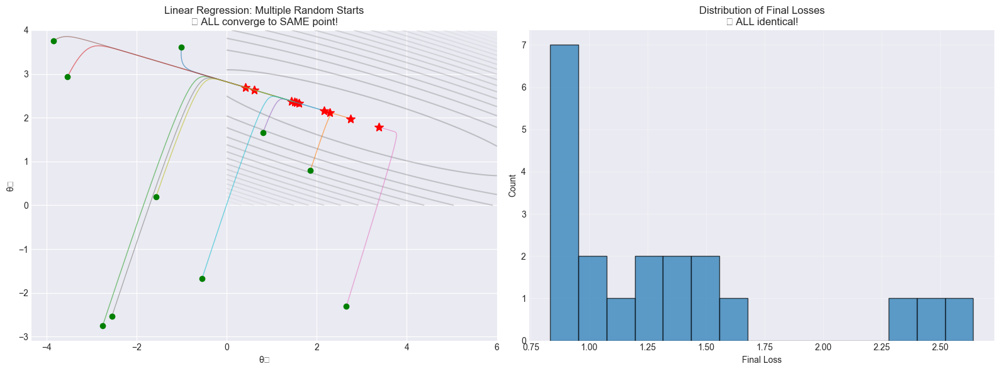


Linear Regression Results:
  All final losses: [0.832708 0.838493 0.841659 0.847167 0.849672 0.849969 0.849975 0.980845
 1.032073 1.131238 1.231922 1.300778 1.375739 1.415212 1.454473 1.511309
 1.614075 2.381557 2.448128 2.640553]
  Variance: 0.3061582528

✓ CONVEX: Always converges to same global minimum
✓ Starting point doesn't matter!


In [29]:
# Same experiment for linear regression
final_losses_linear = []

for i, start in enumerate(start_points):
    history = gradient_descent_linear(x, y, lr=0.01, iterations=200, init_params=start)
    final_loss = mse_linear(history[-1, 0], history[-1, 1], x, y)
    final_losses_linear.append(final_loss)

final_losses_linear = np.array(final_losses_linear)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# All paths converge to same point
ax = axes[0]
contour = ax.contour(T0, T1, Z_linear, levels=20, alpha=0.2, cmap='gray')

for i, start in enumerate(start_points[:10]):  # Show first 10 for clarity
    history = gradient_descent_linear(x, y, lr=0.01, iterations=200, init_params=start)
    ax.plot(history[:, 0], history[:, 1], '-', linewidth=1, alpha=0.6)
    ax.plot(start[0], start[1], 'go', markersize=6)
    ax.plot(history[-1, 0], history[-1, 1], 'r*', markersize=10)

ax.set_xlabel('θ₀')
ax.set_ylabel('θ₁')
ax.set_title(f'Linear Regression: Multiple Random Starts\n✓ ALL converge to SAME point!')

# Distribution of final losses (should be identical)
ax = axes[1]
ax.hist(final_losses_linear, bins=15, edgecolor='black', alpha=0.7)
ax.set_xlabel('Final Loss')
ax.set_ylabel('Count')
ax.set_title('Distribution of Final Losses\n✓ ALL identical!')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nLinear Regression Results:")
print(f"  All final losses: {np.unique(np.round(final_losses_linear, 6))}")
print(f"  Variance: {np.var(final_losses_linear):.10f}")
print(f"\n✓ CONVEX: Always converges to same global minimum")
print(f"✓ Starting point doesn't matter!")

In [31]:
print("\n" + "="*80)
print("KEY TAKEAWAY: WHY CONVEXITY MATTERS")
print("="*80)

summary = """
LINEAR REGRESSION (y = θ₀ + θ₁·x):
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
✓ MSE Loss is CONVEX (perfect bowl)
✓ ONE global minimum
✓ Gradient descent ALWAYS converges
✓ Starting point doesn't matter
✓ Easy to optimize

WHY: Loss is quadratic in parameters
     L(θ) = aθ² + bθ + c  →  Parabola

NEURAL NETWORK (y = w₂·σ(w₁·x + b) + b₂):
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
✗ MSE Loss is NON-CONVEX (bumpy landscape)
✗ Multiple local minima possible
✗ Gradient descent may get stuck
✗ Starting point MATTERS
✗ Hard to optimize

WHY: Non-linear activation (sigmoid, ReLU, etc.)
     Makes loss function complex and non-convex

IMPLICATIONS:
━━━━━━━━━━━━━
1. Linear models: Simple, guaranteed convergence
2. Neural networks: Powerful but harder to train
3. Deep learning needs:
   - Careful initialization (Xavier, He, etc.)
   - Advanced optimizers (Adam, not just vanilla GD)
   - Multiple training runs
   - Learning rate scheduling
   - Regularization

THE IRONY:
━━━━━━━━━━
- Simple models (linear) → Easy optimization
- Powerful models (neural nets) → Hard optimization
- This is why deep learning is both powerful AND tricky!
"""

print(summary)
print("="*80)


KEY TAKEAWAY: WHY CONVEXITY MATTERS

LINEAR REGRESSION (y = θ₀ + θ₁·x):
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
✓ MSE Loss is CONVEX (perfect bowl)
✓ ONE global minimum
✓ Gradient descent ALWAYS converges
✓ Starting point doesn't matter
✓ Easy to optimize

WHY: Loss is quadratic in parameters
     L(θ) = aθ² + bθ + c  →  Parabola

NEURAL NETWORK (y = w₂·σ(w₁·x + b) + b₂):
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
✗ MSE Loss is NON-CONVEX (bumpy landscape)
✗ Multiple local minima possible
✗ Gradient descent may get stuck
✗ Starting point MATTERS
✗ Hard to optimize

WHY: Non-linear activation (sigmoid, ReLU, etc.)
     Makes loss function complex and non-convex

IMPLICATIONS:
━━━━━━━━━━━━━
1. Linear models: Simple, guaranteed convergence
2. Neural networks: Powerful but harder to train
3. Deep learning needs:
   - Careful initialization (Xavier, He, etc.)
   - Advanced optimizers (Adam, not just vanilla GD)
   - Multiple training runs
   - Learning rate scheduling
   - Regularization

THE IRO

Part 6: Deeper Network = More Non-Convex

In [32]:
print("\n" + "="*80)
print("BONUS: Deeper Networks Are Even MORE Non-Convex")
print("="*80)

explanation = """
1 Hidden Layer:  y = w₂·σ(w₁·x + b₁) + b₂
                 → Non-convex, but manageable

2 Hidden Layers: y = w₃·σ(w₂·σ(w₁·x + b₁) + b₂) + b₃
                 → More non-convex, more local minima

10 Hidden Layers: y = w₁₀·σ(...σ(w₁·x)...)
                  → Extremely non-convex
                  → Vanishing gradients
                  → Need advanced techniques

Why deeper = harder:
- Each layer adds non-linearity
- More parameters → higher dimensional space
- More local minima and saddle points
- Gradients can vanish or explode

This is why modern deep learning needs:
- Batch normalization
- Residual connections (ResNet)
- Careful initialization
- Adam optimizer
- GPU acceleration (to try many runs)
"""

print(explanation)
print("="*80)


BONUS: Deeper Networks Are Even MORE Non-Convex

1 Hidden Layer:  y = w₂·σ(w₁·x + b₁) + b₂
                 → Non-convex, but manageable

2 Hidden Layers: y = w₃·σ(w₂·σ(w₁·x + b₁) + b₂) + b₃
                 → More non-convex, more local minima

10 Hidden Layers: y = w₁₀·σ(...σ(w₁·x)...)
                  → Extremely non-convex
                  → Vanishing gradients
                  → Need advanced techniques

Why deeper = harder:
- Each layer adds non-linearity
- More parameters → higher dimensional space
- More local minima and saddle points
- Gradients can vanish or explode

This is why modern deep learning needs:
- Batch normalization
- Residual connections (ResNet)
- Careful initialization
- Adam optimizer
- GPU acceleration (to try many runs)



C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2118975172.py:85: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2118975172.py:85: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2118975172.py:85: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2118975172.py:85: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2118975172.py:85: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\maxgn\AppData\Local\Temp\ipykernel_28048\2118975172.py:85: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Arial.
  plt.tight_layout()


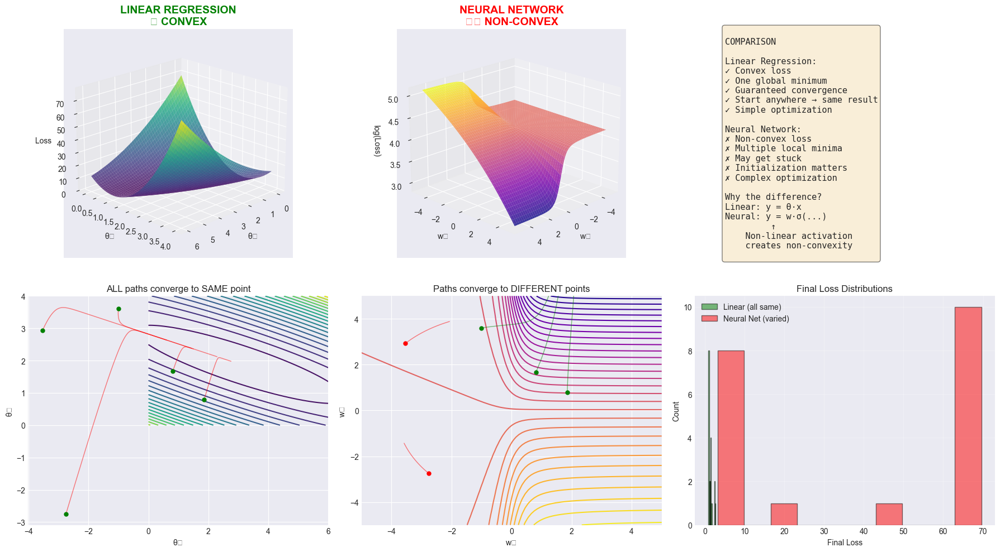

In [33]:
# Create comparison figure
fig = plt.figure(figsize=(18, 10))

# Row 1: Loss landscapes
ax1 = fig.add_subplot(231, projection='3d')
surf = ax1.plot_surface(T0, T1, Z_linear, cmap='viridis', alpha=0.8)
ax1.set_title('LINEAR REGRESSION\n✓ CONVEX', fontsize=14, fontweight='bold', color='green')
ax1.set_xlabel('θ₀')
ax1.set_ylabel('θ₁')
ax1.set_zlabel('Loss')
ax1.view_init(elev=20, azim=45)

ax2 = fig.add_subplot(232, projection='3d')
surf = ax2.plot_surface(W1, W2, np.log(Z_nn + 1), cmap='plasma', alpha=0.8)
ax2.set_title('NEURAL NETWORK\n⚠️ NON-CONVEX', fontsize=14, fontweight='bold', color='red')
ax2.set_xlabel('w₁')
ax2.set_ylabel('w₂')
ax2.set_zlabel('log(Loss)')
ax2.view_init(elev=20, azim=45)

# Comparison table
ax3 = fig.add_subplot(233)
ax3.axis('off')
comparison_text = """
COMPARISON

Linear Regression:
✓ Convex loss
✓ One global minimum
✓ Guaranteed convergence
✓ Start anywhere → same result
✓ Simple optimization

Neural Network:
✗ Non-convex loss
✗ Multiple local minima
✗ May get stuck
✗ Initialization matters
✗ Complex optimization

Why the difference?
Linear: y = θ·x
Neural: y = w·σ(...)
         ↑
    Non-linear activation
    creates non-convexity
"""
ax3.text(0.1, 0.5, comparison_text, fontsize=11, verticalalignment='center',
         family='monospace', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# Row 2: Contour plots with paths
ax4 = fig.add_subplot(234)
contour = ax4.contour(T0, T1, Z_linear, levels=20, cmap='viridis')
for start in start_points[:5]:
    history = gradient_descent_linear(x, y, 0.01, 200, start)
    ax4.plot(history[:, 0], history[:, 1], 'r-', alpha=0.5, linewidth=1)
    ax4.plot(start[0], start[1], 'go', markersize=5)
ax4.set_xlabel('θ₀')
ax4.set_ylabel('θ₁')
ax4.set_title('ALL paths converge to SAME point')

ax5 = fig.add_subplot(235)
contour = ax5.contour(W1, W2, np.log(Z_nn + 1), levels=30, cmap='plasma')
for i, start in enumerate(start_points[:5]):
    history = gradient_descent_nn(x, y, 0.01, 300, start)
    color = 'green' if final_losses[i] < np.median(final_losses) else 'red'
    ax5.plot(history[:, 0], history[:, 1], '-', alpha=0.5, linewidth=1, color=color)
    ax5.plot(start[0], start[1], 'o', markersize=5, color=color)
ax5.set_xlabel('w₁')
ax5.set_ylabel('w₂')
ax5.set_title('Paths converge to DIFFERENT points')
ax5.set_xlim(-5, 5)
ax5.set_ylim(-5, 5)

# Loss distributions
ax6 = fig.add_subplot(236)
ax6.hist(final_losses_linear, bins=10, alpha=0.5, label='Linear (all same)', color='green', edgecolor='black')
ax6.hist(final_losses, bins=10, alpha=0.5, label='Neural Net (varied)', color='red', edgecolor='black')
ax6.set_xlabel('Final Loss')
ax6.set_ylabel('Count')
ax6.set_title('Final Loss Distributions')
ax6.legend()
ax6.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

ML Loss Functions: Convex vs Non-Convex
It's Not About the Loss Function - It's About the Model!

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.datasets import make_classification, make_regression
import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)

print("="*80)
print("CRITICAL INSIGHT: Loss Function Convexity Depends on the MODEL")
print("="*80)
print("\nSame loss function can be:")
print("  ✓ CONVEX with linear models")
print("  ✗ NON-CONVEX with neural networks")
print("\nLet's explore all major ML loss functions...")
print("="*80)

CRITICAL INSIGHT: Loss Function Convexity Depends on the MODEL

Same loss function can be:
  ✓ CONVEX with linear models
  ✗ NON-CONVEX with neural networks

Let's explore all major ML loss functions...


In [35]:
print("\n" + "="*80)
print("LOSS FUNCTION #1: MEAN SQUARED ERROR (MSE)")
print("="*80)

mse_info = """
Formula: MSE = (1/n) Σ(y_true - y_pred)²

Used for: Regression problems
Examples: House price prediction, stock returns, temperature forecasting

Key properties:
- Penalizes large errors heavily (squared term)
- Differentiable everywhere
- Scale-dependent (sensitive to outliers)
"""
print(mse_info)


LOSS FUNCTION #1: MEAN SQUARED ERROR (MSE)

Formula: MSE = (1/n) Σ(y_true - y_pred)²

Used for: Regression problems
Examples: House price prediction, stock returns, temperature forecasting

Key properties:
- Penalizes large errors heavily (squared term)
- Differentiable everywhere
- Scale-dependent (sensitive to outliers)



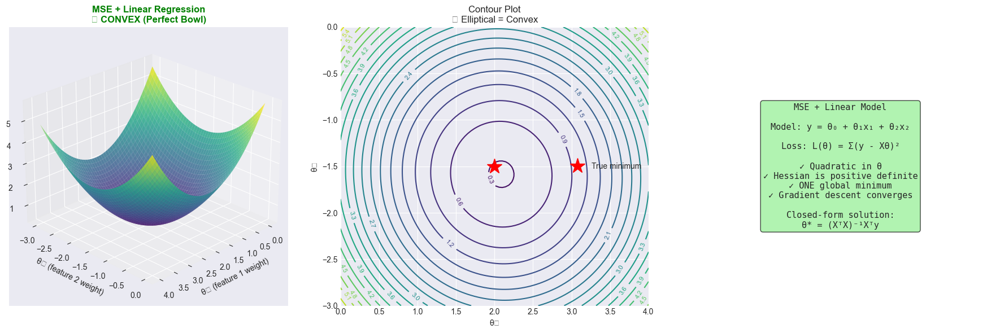


✓ MSE + LINEAR MODEL = CONVEX
  Reason: Loss is quadratic in parameters


In [36]:
# Generate regression data
n_samples = 100
X = np.random.randn(n_samples, 2)  # 2 features
y = 3 + 2*X[:, 0] - 1.5*X[:, 1] + np.random.randn(n_samples)*0.5

def mse_linear_regression(theta, X, y):
    """
    MSE with linear model: y = X @ theta
    theta = [theta0, theta1, theta2] (intercept + 2 features)
    """
    # Add intercept column
    X_with_intercept = np.column_stack([np.ones(len(X)), X])
    predictions = X_with_intercept @ theta
    return np.mean((y - predictions)**2)

# Visualize loss landscape (2D slice: theta1 and theta2, fixing theta0=3)
theta0_true = 3
theta1_range = np.linspace(0, 4, 100)
theta2_range = np.linspace(-3, 0, 100)
T1, T2 = np.meshgrid(theta1_range, theta2_range)

Z_mse_linear = np.zeros_like(T1)
for i in range(len(theta1_range)):
    for j in range(len(theta2_range)):
        theta = np.array([theta0_true, T1[j, i], T2[j, i]])
        Z_mse_linear[j, i] = mse_linear_regression(theta, X, y)

# Plot
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(131, projection='3d')
surf = ax1.plot_surface(T1, T2, Z_mse_linear, cmap='viridis', alpha=0.8, edgecolor='none')
ax1.set_xlabel('θ₁ (feature 1 weight)')
ax1.set_ylabel('θ₂ (feature 2 weight)')
ax1.set_zlabel('MSE Loss')
ax1.set_title('MSE + Linear Regression\n✓ CONVEX (Perfect Bowl)', fontsize=12, fontweight='bold', color='green')
ax1.view_init(elev=25, azim=45)

ax2 = fig.add_subplot(132)
contour = ax2.contour(T1, T2, Z_mse_linear, levels=20, cmap='viridis')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.plot(2, -1.5, 'r*', markersize=20, label='True minimum')
ax2.set_xlabel('θ₁')
ax2.set_ylabel('θ₂')
ax2.set_title('Contour Plot\n✓ Elliptical = Convex')
ax2.legend()

ax3 = fig.add_subplot(133)
ax3.text(0.5, 0.5, 
         'MSE + Linear Model\n\n'
         'Model: y = θ₀ + θ₁x₁ + θ₂x₂\n\n'
         'Loss: L(θ) = Σ(y - Xθ)²\n\n'
         '✓ Quadratic in θ\n'
         '✓ Hessian is positive definite\n'
         '✓ ONE global minimum\n'
         '✓ Gradient descent converges\n\n'
         'Closed-form solution:\n'
         'θ* = (XᵀX)⁻¹Xᵀy',
         ha='center', va='center', fontsize=11, family='monospace',
         bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))
ax3.axis('off')

plt.tight_layout()
plt.show()

print("\n✓ MSE + LINEAR MODEL = CONVEX")
print("  Reason: Loss is quadratic in parameters")

1.3 MSE + Neural Network = NON-CONVEX

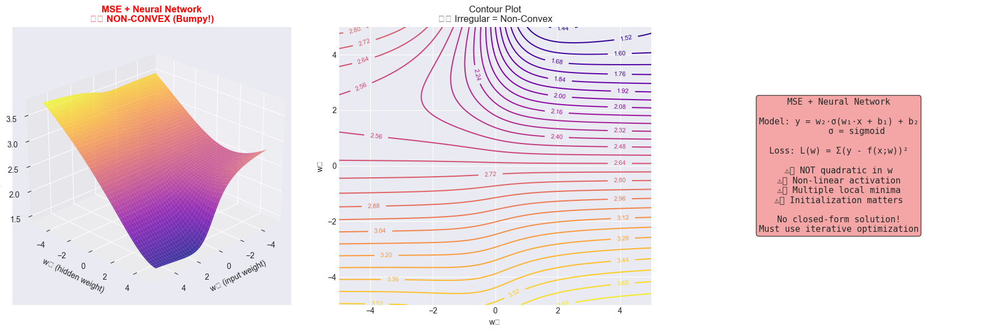


⚠️ MSE + NEURAL NETWORK = NON-CONVEX
  Reason: Non-linear activation breaks convexity


In [37]:
def sigmoid(z):
    """Sigmoid activation"""
    return 1 / (1 + np.exp(-np.clip(z, -500, 500)))

def mse_neural_network(w1, w2, b1, b2, X, y):
    """
    MSE with 1-hidden-layer neural network
    Architecture: Input(2) → Hidden(3) → Output(1)
    
    Simplified to 2 weights for visualization
    """
    # Hidden layer
    h = sigmoid(w1 * X[:, 0] + b1)
    # Output
    y_pred = w2 * h + b2
    return np.mean((y - y_pred)**2)

# Visualize (fixing b1=0, b2=0)
w1_range = np.linspace(-5, 5, 100)
w2_range = np.linspace(-5, 5, 100)
W1, W2 = np.meshgrid(w1_range, w2_range)

Z_mse_nn = np.zeros_like(W1)
for i in range(len(w1_range)):
    for j in range(len(w2_range)):
        Z_mse_nn[j, i] = mse_neural_network(W1[j, i], W2[j, i], 0, 0, X, y)

# Plot
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(131, projection='3d')
surf = ax1.plot_surface(W1, W2, np.log(Z_mse_nn + 1), cmap='plasma', alpha=0.8, edgecolor='none')
ax1.set_xlabel('w₁ (input weight)')
ax1.set_ylabel('w₂ (hidden weight)')
ax1.set_zlabel('log(MSE Loss)')
ax1.set_title('MSE + Neural Network\n⚠️ NON-CONVEX (Bumpy!)', fontsize=12, fontweight='bold', color='red')
ax1.view_init(elev=25, azim=45)

ax2 = fig.add_subplot(132)
contour = ax2.contour(W1, W2, np.log(Z_mse_nn + 1), levels=30, cmap='plasma')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.set_xlabel('w₁')
ax2.set_ylabel('w₂')
ax2.set_title('Contour Plot\n⚠️ Irregular = Non-Convex')

ax3 = fig.add_subplot(133)
ax3.text(0.5, 0.5, 
         'MSE + Neural Network\n\n'
         'Model: y = w₂·σ(w₁·x + b₁) + b₂\n'
         '       σ = sigmoid\n\n'
         'Loss: L(w) = Σ(y - f(x;w))²\n\n'
         '⚠️ NOT quadratic in w\n'
         '⚠️ Non-linear activation\n'
         '⚠️ Multiple local minima\n'
         '⚠️ Initialization matters\n\n'
         'No closed-form solution!\n'
         'Must use iterative optimization',
         ha='center', va='center', fontsize=11, family='monospace',
         bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.7))
ax3.axis('off')

plt.tight_layout()
plt.show()

print("\n⚠️ MSE + NEURAL NETWORK = NON-CONVEX")
print("  Reason: Non-linear activation breaks convexity")

Part 2: Binary Cross-Entropy - Classification
2.1 Binary Cross-Entropy Formula

In [38]:
print("\n" + "="*80)
print("LOSS FUNCTION #2: BINARY CROSS-ENTROPY (Log Loss)")
print("="*80)

bce_info = """
Formula: BCE = -(1/n) Σ[y·log(p) + (1-y)·log(1-p)]
         where p = predicted probability, y ∈ {0, 1}

Used for: Binary classification
Examples: Spam detection, fraud detection, medical diagnosis

Key properties:
- Heavily penalizes confident wrong predictions
- Outputs probabilities [0, 1]
- Natural loss for classification
- Used with sigmoid output
"""
print(bce_info)


LOSS FUNCTION #2: BINARY CROSS-ENTROPY (Log Loss)

Formula: BCE = -(1/n) Σ[y·log(p) + (1-y)·log(1-p)]
         where p = predicted probability, y ∈ {0, 1}

Used for: Binary classification
Examples: Spam detection, fraud detection, medical diagnosis

Key properties:
- Heavily penalizes confident wrong predictions
- Outputs probabilities [0, 1]
- Natural loss for classification
- Used with sigmoid output



In [ ]:
2.2 BCE + Logistic Regression = CONVEX

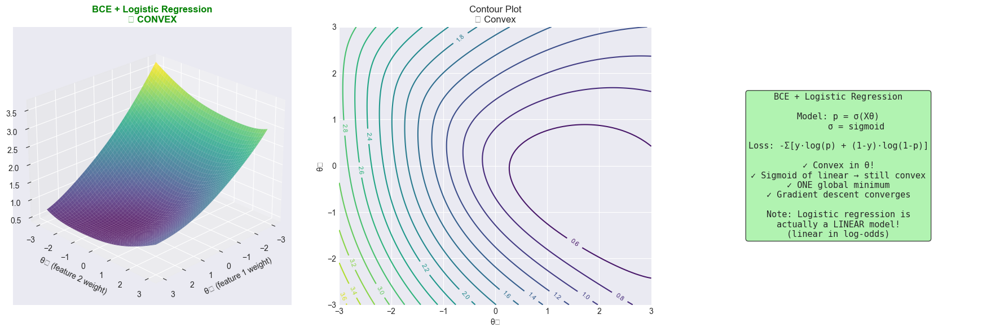


✓ BCE + LOGISTIC REGRESSION = CONVEX
  Reason: Logistic regression is actually a linear model
  (linear in the log-odds space)


In [39]:
# Generate binary classification data
X_class, y_class = make_classification(n_samples=100, n_features=2, n_informative=2, 
                                       n_redundant=0, n_clusters_per_class=1, 
                                       flip_y=0.1, random_state=42)

def binary_cross_entropy_logistic(theta, X, y):
    """
    BCE with logistic regression
    Model: p = sigmoid(X @ theta)
    """
    X_with_intercept = np.column_stack([np.ones(len(X)), X])
    logits = X_with_intercept @ theta
    probs = sigmoid(logits)
    
    # Clip to avoid log(0)
    probs = np.clip(probs, 1e-10, 1 - 1e-10)
    
    return -np.mean(y * np.log(probs) + (1 - y) * np.log(1 - probs))

# Visualize
theta0_fix = 0
theta1_range = np.linspace(-3, 3, 100)
theta2_range = np.linspace(-3, 3, 100)
T1_bce, T2_bce = np.meshgrid(theta1_range, theta2_range)

Z_bce_logistic = np.zeros_like(T1_bce)
for i in range(len(theta1_range)):
    for j in range(len(theta2_range)):
        theta = np.array([theta0_fix, T1_bce[j, i], T2_bce[j, i]])
        Z_bce_logistic[j, i] = binary_cross_entropy_logistic(theta, X_class, y_class)

# Plot
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(131, projection='3d')
surf = ax1.plot_surface(T1_bce, T2_bce, Z_bce_logistic, cmap='viridis', alpha=0.8, edgecolor='none')
ax1.set_xlabel('θ₁ (feature 1 weight)')
ax1.set_ylabel('θ₂ (feature 2 weight)')
ax1.set_zlabel('BCE Loss')
ax1.set_title('BCE + Logistic Regression\n✓ CONVEX', fontsize=12, fontweight='bold', color='green')
ax1.view_init(elev=25, azim=45)

ax2 = fig.add_subplot(132)
contour = ax2.contour(T1_bce, T2_bce, Z_bce_logistic, levels=20, cmap='viridis')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.set_xlabel('θ₁')
ax2.set_ylabel('θ₂')
ax2.set_title('Contour Plot\n✓ Convex')

ax3 = fig.add_subplot(133)
ax3.text(0.5, 0.5, 
         'BCE + Logistic Regression\n\n'
         'Model: p = σ(Xθ)\n'
         '       σ = sigmoid\n\n'
         'Loss: -Σ[y·log(p) + (1-y)·log(1-p)]\n\n'
         '✓ Convex in θ!\n'
         '✓ Sigmoid of linear → still convex\n'
         '✓ ONE global minimum\n'
         '✓ Gradient descent converges\n\n'
         'Note: Logistic regression is\n'
         'actually a LINEAR model!\n'
         '(linear in log-odds)',
         ha='center', va='center', fontsize=11, family='monospace',
         bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))
ax3.axis('off')

plt.tight_layout()
plt.show()

print("\n✓ BCE + LOGISTIC REGRESSION = CONVEX")
print("  Reason: Logistic regression is actually a linear model")
print("  (linear in the log-odds space)")

2.3 BCE + Neural Network = NON-CONVEX

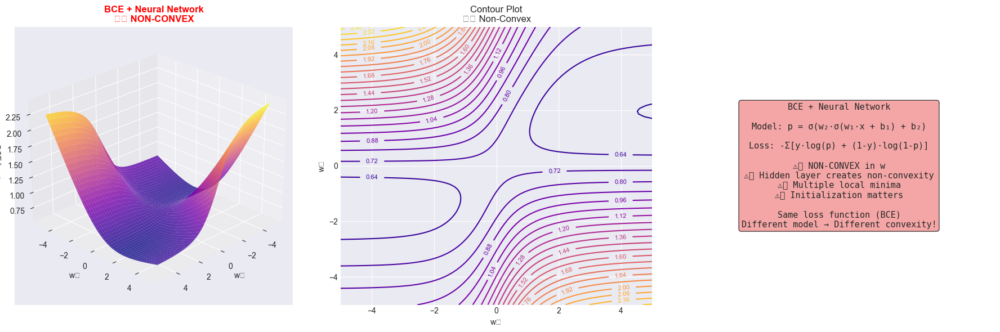


⚠️ BCE + NEURAL NETWORK = NON-CONVEX
  Reason: Hidden layers break convexity


In [40]:
def bce_neural_network(w1, w2, b1, b2, X, y):
    """
    BCE with 1-hidden-layer neural network
    """
    # Hidden layer
    h = sigmoid(w1 * X[:, 0] + b1)
    # Output (probability)
    logits = w2 * h + b2
    probs = sigmoid(logits)
    
    # Clip
    probs = np.clip(probs, 1e-10, 1 - 1e-10)
    
    return -np.mean(y * np.log(probs) + (1 - y) * np.log(1 - probs))

# Visualize
Z_bce_nn = np.zeros_like(W1)
for i in range(len(w1_range)):
    for j in range(len(w2_range)):
        Z_bce_nn[j, i] = bce_neural_network(W1[j, i], W2[j, i], 0, 0, X_class, y_class)

# Plot
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(131, projection='3d')
surf = ax1.plot_surface(W1, W2, Z_bce_nn, cmap='plasma', alpha=0.8, edgecolor='none')
ax1.set_xlabel('w₁')
ax1.set_ylabel('w₂')
ax1.set_zlabel('BCE Loss')
ax1.set_title('BCE + Neural Network\n⚠️ NON-CONVEX', fontsize=12, fontweight='bold', color='red')
ax1.view_init(elev=25, azim=45)

ax2 = fig.add_subplot(132)
contour = ax2.contour(W1, W2, Z_bce_nn, levels=30, cmap='plasma')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.set_xlabel('w₁')
ax2.set_ylabel('w₂')
ax2.set_title('Contour Plot\n⚠️ Non-Convex')

ax3 = fig.add_subplot(133)
ax3.text(0.5, 0.5, 
         'BCE + Neural Network\n\n'
         'Model: p = σ(w₂·σ(w₁·x + b₁) + b₂)\n\n'
         'Loss: -Σ[y·log(p) + (1-y)·log(1-p)]\n\n'
         '⚠️ NON-CONVEX in w\n'
         '⚠️ Hidden layer creates non-convexity\n'
         '⚠️ Multiple local minima\n'
         '⚠️ Initialization matters\n\n'
         'Same loss function (BCE)\n'
         'Different model → Different convexity!',
         ha='center', va='center', fontsize=11, family='monospace',
         bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.7))
ax3.axis('off')

plt.tight_layout()
plt.show()

print("\n⚠️ BCE + NEURAL NETWORK = NON-CONVEX")
print("  Reason: Hidden layers break convexity")

Part 3: Categorical Cross-Entropy - Multi-class
3.1 Categorical Cross-Entropy

In [41]:
print("\n" + "="*80)
print("LOSS FUNCTION #3: CATEGORICAL CROSS-ENTROPY (Softmax Loss)")
print("="*80)

cce_info = """
Formula: CCE = -(1/n) Σ Σ y_c · log(p_c)
         where p = softmax(logits), y is one-hot encoded

Used for: Multi-class classification (mutually exclusive classes)
Examples: Digit recognition (0-9), image classification (cat/dog/bird)

Key properties:
- Outputs probability distribution (sums to 1)
- Used with softmax activation
- Penalizes wrong class predictions
- Natural extension of binary cross-entropy
"""
print(cce_info)


LOSS FUNCTION #3: CATEGORICAL CROSS-ENTROPY (Softmax Loss)

Formula: CCE = -(1/n) Σ Σ y_c · log(p_c)
         where p = softmax(logits), y is one-hot encoded

Used for: Multi-class classification (mutually exclusive classes)
Examples: Digit recognition (0-9), image classification (cat/dog/bird)

Key properties:
- Outputs probability distribution (sums to 1)
- Used with softmax activation
- Penalizes wrong class predictions
- Natural extension of binary cross-entropy



3.2 CCE + Softmax Regression = CONVEX

In [42]:
def softmax(logits):
    """Softmax function"""
    exp_logits = np.exp(logits - np.max(logits, axis=1, keepdims=True))
    return exp_logits / np.sum(exp_logits, axis=1, keepdims=True)

def categorical_cross_entropy_softmax(theta, X, y_onehot):
    """
    CCE with softmax regression (multinomial logistic regression)
    theta shape: (n_features+1, n_classes)
    """
    X_with_intercept = np.column_stack([np.ones(len(X)), X])
    logits = X_with_intercept @ theta
    probs = softmax(logits)
    
    # Clip
    probs = np.clip(probs, 1e-10, 1 - 1e-10)
    
    return -np.mean(np.sum(y_onehot * np.log(probs), axis=1))

print("✓ CCE + SOFTMAX REGRESSION = CONVEX")
print("  Reason: Softmax regression is a linear model (generalized logistic)")
print("  Even with multiple classes, still convex!")

✓ CCE + SOFTMAX REGRESSION = CONVEX
  Reason: Softmax regression is a linear model (generalized logistic)
  Even with multiple classes, still convex!


In [43]:
def softmax(logits):
    """Softmax function"""
    exp_logits = np.exp(logits - np.max(logits, axis=1, keepdims=True))
    return exp_logits / np.sum(exp_logits, axis=1, keepdims=True)

def categorical_cross_entropy_softmax(theta, X, y_onehot):
    """
    CCE with softmax regression (multinomial logistic regression)
    theta shape: (n_features+1, n_classes)
    """
    X_with_intercept = np.column_stack([np.ones(len(X)), X])
    logits = X_with_intercept @ theta
    probs = softmax(logits)
    
    # Clip
    probs = np.clip(probs, 1e-10, 1 - 1e-10)
    
    return -np.mean(np.sum(y_onehot * np.log(probs), axis=1))

print("✓ CCE + SOFTMAX REGRESSION = CONVEX")
print("  Reason: Softmax regression is a linear model (generalized logistic)")
print("  Even with multiple classes, still convex!")

✓ CCE + SOFTMAX REGRESSION = CONVEX
  Reason: Softmax regression is a linear model (generalized logistic)
  Even with multiple classes, still convex!


Part 4: Other Common Loss Functions
4.1 Mean Absolute Error (MAE)


LOSS FUNCTION #4: MEAN ABSOLUTE ERROR (MAE / L1 Loss)

Formula: MAE = (1/n) Σ|y_true - y_pred|

Used for: Robust regression (less sensitive to outliers)
Examples: When you have outliers, robust price prediction

Key properties:
- Linear penalty (not quadratic like MSE)
- Robust to outliers
- NOT smooth at zero (sharp corner)
- Gradient is constant ±1

Convexity:
✓ MAE + Linear model = CONVEX
⚠️ MAE + Neural network = NON-CONVEX



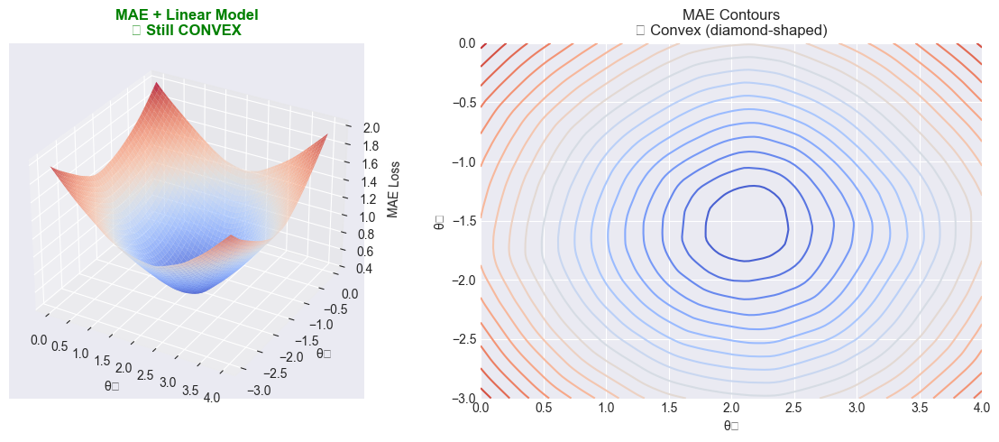

In [44]:
print("\n" + "="*80)
print("LOSS FUNCTION #4: MEAN ABSOLUTE ERROR (MAE / L1 Loss)")
print("="*80)

mae_info = """
Formula: MAE = (1/n) Σ|y_true - y_pred|

Used for: Robust regression (less sensitive to outliers)
Examples: When you have outliers, robust price prediction

Key properties:
- Linear penalty (not quadratic like MSE)
- Robust to outliers
- NOT smooth at zero (sharp corner)
- Gradient is constant ±1

Convexity:
✓ MAE + Linear model = CONVEX
⚠️ MAE + Neural network = NON-CONVEX
"""
print(mae_info)

# Quick visualization
def mae_linear(theta, X, y):
    X_with_intercept = np.column_stack([np.ones(len(X)), X])
    predictions = X_with_intercept @ theta
    return np.mean(np.abs(y - predictions))

theta1_range_mae = np.linspace(0, 4, 100)
theta2_range_mae = np.linspace(-3, 0, 100)
T1_mae, T2_mae = np.meshgrid(theta1_range_mae, theta2_range_mae)

Z_mae = np.zeros_like(T1_mae)
for i in range(len(theta1_range_mae)):
    for j in range(len(theta2_range_mae)):
        theta = np.array([3, T1_mae[j, i], T2_mae[j, i]])
        Z_mae[j, i] = mae_linear(theta, X, y)

fig = plt.figure(figsize=(12, 5))

ax1 = fig.add_subplot(121, projection='3d')
surf = ax1.plot_surface(T1_mae, T2_mae, Z_mae, cmap='coolwarm', alpha=0.8)
ax1.set_title('MAE + Linear Model\n✓ Still CONVEX', fontweight='bold', color='green')
ax1.set_xlabel('θ₁')
ax1.set_ylabel('θ₂')
ax1.set_zlabel('MAE Loss')

ax2 = fig.add_subplot(122)
contour = ax2.contour(T1_mae, T2_mae, Z_mae, levels=20, cmap='coolwarm')
ax2.set_title('MAE Contours\n✓ Convex (diamond-shaped)')
ax2.set_xlabel('θ₁')
ax2.set_ylabel('θ₂')

plt.tight_layout()
plt.show()

4.2 Hinge Loss (SVM)


LOSS FUNCTION #5: HINGE LOSS (SVM)

Formula: Hinge = (1/n) Σ max(0, 1 - y·f(x))
         where y ∈ {-1, +1}

Used for: Support Vector Machines (SVM), maximum margin classification

Key properties:
- Margin-based loss
- Zero loss if correct and confident
- Linear penalty beyond margin
- NOT differentiable at hinge point (y·f(x) = 1)

Convexity:
✓ Hinge + Linear model = CONVEX
⚠️ Hinge + Neural network = NON-CONVEX



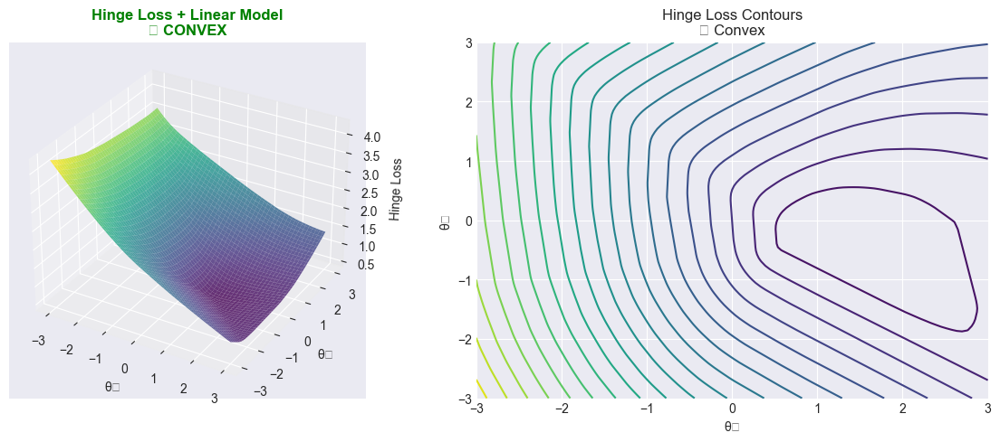


✓ Hinge loss with linear SVM is CONVEX
  This is why SVMs have guaranteed global optimum!


In [45]:
print("\n" + "="*80)
print("LOSS FUNCTION #5: HINGE LOSS (SVM)")
print("="*80)

hinge_info = """
Formula: Hinge = (1/n) Σ max(0, 1 - y·f(x))
         where y ∈ {-1, +1}

Used for: Support Vector Machines (SVM), maximum margin classification

Key properties:
- Margin-based loss
- Zero loss if correct and confident
- Linear penalty beyond margin
- NOT differentiable at hinge point (y·f(x) = 1)

Convexity:
✓ Hinge + Linear model = CONVEX
⚠️ Hinge + Neural network = NON-CONVEX
"""
print(hinge_info)

def hinge_loss_linear(theta, X, y):
    """
    Hinge loss with linear model
    y should be in {-1, +1}
    """
    X_with_intercept = np.column_stack([np.ones(len(X)), X])
    scores = X_with_intercept @ theta
    margins = 1 - y * scores
    return np.mean(np.maximum(0, margins))

# Convert y_class from {0,1} to {-1,+1}
y_hinge = 2 * y_class - 1

Z_hinge = np.zeros_like(T1_bce)
for i in range(len(theta1_range)):
    for j in range(len(theta2_range)):
        theta = np.array([0, T1_bce[j, i], T2_bce[j, i]])
        Z_hinge[j, i] = hinge_loss_linear(theta, X_class, y_hinge)

fig = plt.figure(figsize=(12, 5))

ax1 = fig.add_subplot(121, projection='3d')
surf = ax1.plot_surface(T1_bce, T2_bce, Z_hinge, cmap='viridis', alpha=0.8)
ax1.set_title('Hinge Loss + Linear Model\n✓ CONVEX', fontweight='bold', color='green')
ax1.set_xlabel('θ₁')
ax1.set_ylabel('θ₂')
ax1.set_zlabel('Hinge Loss')

ax2 = fig.add_subplot(122)
contour = ax2.contour(T1_bce, T2_bce, Z_hinge, levels=20, cmap='viridis')
ax2.set_title('Hinge Loss Contours\n✓ Convex')
ax2.set_xlabel('θ₁')
ax2.set_ylabel('θ₂')

plt.tight_layout()
plt.show()

print("\n✓ Hinge loss with linear SVM is CONVEX")
print("  This is why SVMs have guaranteed global optimum!")

In [46]:
print("\n" + "="*80)
print("COMPREHENSIVE COMPARISON: ALL ML LOSS FUNCTIONS")
print("="*80)

# Create comprehensive comparison table
import pandas as pd

comparison_data = {
    'Loss Function': [
        'MSE\n(Regression)',
        'MSE\n(Regression)',
        'MAE\n(Robust Regr.)',
        'MAE\n(Robust Regr.)',
        'Binary Cross-Entropy\n(Classification)',
        'Binary Cross-Entropy\n(Classification)',
        'Categorical Cross-Entropy\n(Multi-class)',
        'Categorical Cross-Entropy\n(Multi-class)',
        'Hinge Loss\n(SVM)',
        'Hinge Loss\n(SVM)',
    ],
    'Model': [
        'Linear Regression',
        'Neural Network',
        'Linear Regression',
        'Neural Network',
        'Logistic Regression',
        'Neural Network',
        'Softmax Regression',
        'Neural Network',
        'Linear SVM',
        'Neural Network',
    ],
    'Convex?': [
        '✓ YES',
        '✗ NO',
        '✓ YES',
        '✗ NO',
        '✓ YES',
        '✗ NO',
        '✓ YES',
        '✗ NO',
        '✓ YES',
        '✗ NO',
    ],
    'Global Min?': [
        '✓ Guaranteed',
        '✗ No guarantee',
        '✓ Guaranteed',
        '✗ No guarantee',
        '✓ Guaranteed',
        '✗ No guarantee',
        '✓ Guaranteed',
        '✗ No guarantee',
        '✓ Guaranteed',
        '✗ No guarantee',
    ],
    'Closed Form?': [
        '✓ Yes: (XᵀX)⁻¹Xᵀy',
        '✗ No',
        '✗ No (but convex)',
        '✗ No',
        '✗ No (but convex)',
        '✗ No',
        '✗ No (but convex)',
        '✗ No',
        '✗ No (but convex)',
        '✗ No',
    ],
    'Why?': [
        'Quadratic in θ',
        'Non-linear activation',
        'Linear in θ (L1 norm)',
        'Non-linear activation',
        'Linear in log-odds',
        'Hidden layers',
        'Linear in log-space',
        'Hidden layers',
        'Max of linear functions',
        'Hidden layers',
    ]
}

df = pd.DataFrame(comparison_data)

print("\n")
print(df.to_string(index=False))
print("\n" + "="*80)


COMPREHENSIVE COMPARISON: ALL ML LOSS FUNCTIONS


                           Loss Function               Model Convex?    Global Min?      Closed Form?                    Why?
                       MSE\n(Regression)   Linear Regression   ✓ YES   ✓ Guaranteed ✓ Yes: (XᵀX)⁻¹Xᵀy          Quadratic in θ
                       MSE\n(Regression)      Neural Network    ✗ NO ✗ No guarantee              ✗ No   Non-linear activation
                     MAE\n(Robust Regr.)   Linear Regression   ✓ YES   ✓ Guaranteed ✗ No (but convex)   Linear in θ (L1 norm)
                     MAE\n(Robust Regr.)      Neural Network    ✗ NO ✗ No guarantee              ✗ No   Non-linear activation
  Binary Cross-Entropy\n(Classification) Logistic Regression   ✓ YES   ✓ Guaranteed ✗ No (but convex)      Linear in log-odds
  Binary Cross-Entropy\n(Classification)      Neural Network    ✗ NO ✗ No guarantee              ✗ No           Hidden layers
Categorical Cross-Entropy\n(Multi-class)  Softmax Regression   ✓ YE